# Installing packages
Only run the code block below to install the necessary packages.

# Importing Libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from keras.preprocessing import image
from keras.models import Sequential, Model
from keras.layers import Dense, LeakyReLU, BatchNormalization, Reshape, Flatten, Input
from keras.models import load_model
from keras.optimizers import Adam

2023-12-13 13:09:21.664479: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-13 13:09:21.707621: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-13 13:09:21.707683: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-13 13:09:21.707736: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-13 13:09:21.715920: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-13 13:09:21.716861: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

This section imports necessary libraries for the implementation of the Generative Adversarial Network (GAN) project. It includes libraries for numerical operations (numpy), data visualization (matplotlib), and the components of the Keras deep learning framework (Sequential, Model, Dense, LeakyReLU, BatchNormalization, Reshape, Flatten, Input, and Adam optimizer). The MNIST dataset is also imported from Keras.

# Loading dataset

In [2]:
# Specify the path to the folder containing your images
dataset_path = "dataset_v2"

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(dataset_path) if f.endswith('.jpg')]  # Update the extension based on your image format

# Initialize an empty array to store the images
images = []
counter = 0

# Load and preprocess each image
for file_name in image_files:
    file_path = os.path.join(dataset_path, file_name)

    # Load the image using keras.preprocessing.image.load_img
    img = image.load_img(file_path)  # Adjust the target_size based on your requirements

    # Convert the image to a numpy array
    img_array = image.img_to_array(img)

    # Preprocess the image (adjust as needed)
    img_array = img_array.astype(np.float32) / 255

    # Flatten the image and add it to the list
    images.append(img_array)

# Convert the list of images to a numpy array
X_train = np.array(images)
print("X_train shape:", X_train.shape)

# Reshape the images
X_train = X_train.reshape(X_train.shape[0], -1)  # -1 automatically computes the remaining dimension

print("X_train shape:", X_train.shape)


X_train shape: (150, 128, 128, 3)
X_train shape: (150, 49152)


# Generator Definition

This section defines a function create_generator() that returns a generator model. The generator is a Sequential model with multiple dense layers, LeakyReLU activation, and Batch Normalization. It generates synthetic images with a tanh activation function.

In [3]:
# Generator
def create_generator():
    generator = Sequential()
    generator.add(Dense(256, input_dim=100))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum=0.8))
    generator.add(Dense(512))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum=0.8))
    generator.add(Dense(1024))
    generator.add(LeakyReLU(0.2))
    generator.add(BatchNormalization(momentum=0.8))
    generator.add(Dense(49152, activation='sigmoid'))
    generator.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5))
    return generator

#Discriminator Definition
Similar to the generator, this section defines a function create_discriminator() that returns a discriminator model. The discriminator is also a Sequential model with dense layers, LeakyReLU activation, and a sigmoid activation in the output layer for binary classification.

In [4]:
# Discriminator
def create_discriminator():
    discriminator = Sequential()
    discriminator.add(Dense(1024, input_dim=49152))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dense(512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dense(1, activation='sigmoid'))
    discriminator.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5))
    return discriminator

#GAN Definition
This section defines a function create_gan() that takes a generator and discriminator as input and returns a GAN model. The GAN model is created by connecting the generator and discriminator in a sequential manner. During training, the discriminator is set to be not trainable.



In [5]:
def create_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(gan_input, gan_output)
    gan.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5))
    return gan

#Training the GAN
This section defines a function train_gan() responsible for training the GAN. It includes a loop over epochs and batches. The generator and discriminator are trained iteratively, and the losses are printed. Additionally, there is a call to plot_generated_images() for visualizing generated images during training.

You may opt to remove this part especially when editing this base code. Also note that this part will be helpful in the latter part of the project for producing and testing the model outputs.

In [6]:
def train_gan(generator, discriminator, gan, X_train, epochs=1, batch_size=128):
    batch_count = X_train.shape[0] // batch_size

    for e in range(epochs):
        for _ in range(batch_count):
            noise = np.random.normal(0, 1, size=[batch_size, 100])
            generated_images = generator.predict(noise)
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=batch_size)]
            discriminator.trainable = True
            d_loss_real = discriminator.train_on_batch(image_batch, np.ones(batch_size))
            d_loss_fake = discriminator.train_on_batch(generated_images, np.zeros(batch_size))
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, size=[batch_size, 100])
            discriminator.trainable = False
            g_loss = gan.train_on_batch(noise, np.ones(batch_size))

        print(f"Epoch {e}/{epochs}, D Loss: {d_loss}, G Loss: {g_loss}")

        if e == 0 or (e + 1) % 10 == 0:
            plot_generated_images(generator, e)


#Image Plotting Function
This section defines a function plot_generated_images() that generates and plots synthetic images using the trained generator. It saves the generated images to a file and displays them for visualization.

In [7]:
def plot_generated_images(generator, epoch, examples=10, dim=(1, 10), figsize=(10, 1)):
    noise = np.random.normal(0, 1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(examples, 128, 128, 3)
    plt.figure(figsize=figsize)
    print(np.max(generated_images), np.min(generated_images))
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i + 1)
        #img = np.clip(generated_images[i] * 255.0, 0, 255)
        #img_discrete = np.clip((generated_images[i] + 1) * 127.5, 0, 255).astype(np.uint8)
        plt.imshow((generated_images[i] * 255).astype(np.uint8), cmap='viridis', interpolation="nearest")
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'gan_generated_image_epoch_{epoch}.png')
    plt.show()

#Model Instantiation and Training
Finally, this section instantiates the generator, discriminator, and GAN models, and then calls the train_gan() function to train the GAN using the MNIST dataset.

Note that the number of epochs is only 1 so that you can already see the output in a short run.

2/2 [==============================] - 0s 27ms/step
Epoch 0/1000, D Loss: 34.13913559913635, G Loss: 64.9715347290039
1/1 [==============================] - 0s 32ms/step
0.59398186 0.42495525


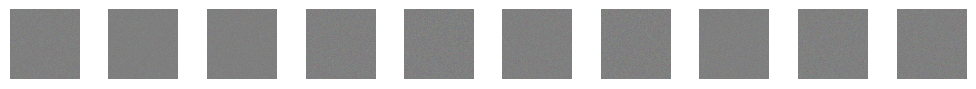

2/2 [==============================] - 0s 22ms/step
Epoch 1/1000, D Loss: 17.191260401625186, G Loss: 0.0002574534446466714
2/2 [==============================] - 0s 24ms/step
Epoch 2/1000, D Loss: 6.732633242531847, G Loss: 52.83640670776367
2/2 [==============================] - 0s 22ms/step
Epoch 3/1000, D Loss: 24.67040729522705, G Loss: 45.739646911621094
2/2 [==============================] - 0s 22ms/step
Epoch 4/1000, D Loss: 2.0723641281947494, G Loss: 31.539566040039062
2/2 [==============================] - 0s 22ms/step
Epoch 5/1000, D Loss: 4.531981110572815, G Loss: 3.2960197925567627
2/2 [==============================] - 0s 22ms/step
Epoch 6/1000, D Loss: 1.664401650428772, G Loss: 6.610620498657227
2/2 [==============================] - 0s 22ms/step
Epoch 7/1000, D Loss: 1.12812140583992, G Loss: 9.070147514343262
2/2 [==============================] - 0s 22ms/step
Epoch 8/1000, D Loss: 3.2730497121810913, G Loss: 3.969247341156006
2/2 [==============================] - 

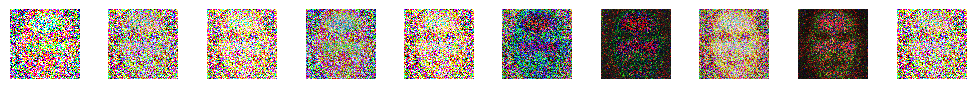

2/2 [==============================] - 0s 22ms/step
Epoch 10/1000, D Loss: 1.1541568636894226, G Loss: 5.360464096069336
2/2 [==============================] - 0s 24ms/step
Epoch 11/1000, D Loss: 0.5710717141628265, G Loss: 4.5684428215026855
2/2 [==============================] - 0s 22ms/step
Epoch 12/1000, D Loss: 2.7518256306648254, G Loss: 3.156506061553955
2/2 [==============================] - 0s 23ms/step
Epoch 13/1000, D Loss: 10.795547008514404, G Loss: 30.078611373901367
2/2 [==============================] - 0s 22ms/step
Epoch 14/1000, D Loss: 27.805187225341797, G Loss: 15.941346168518066
2/2 [==============================] - 0s 22ms/step
Epoch 15/1000, D Loss: 15.454026699066162, G Loss: 2.321183204650879
2/2 [==============================] - 0s 24ms/step
Epoch 16/1000, D Loss: 1.089229553937912, G Loss: 7.433626174926758
2/2 [==============================] - 0s 23ms/step
Epoch 17/1000, D Loss: 0.8989696502685547, G Loss: 7.244203090667725
2/2 [=========================

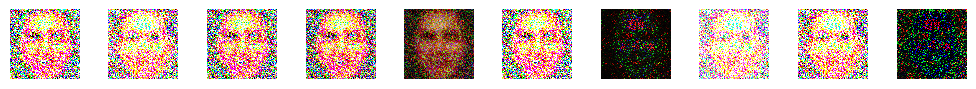

2/2 [==============================] - 0s 25ms/step
Epoch 20/1000, D Loss: 3.7335699796676636, G Loss: 2.3928890228271484
2/2 [==============================] - 0s 23ms/step
Epoch 21/1000, D Loss: 0.598737433552742, G Loss: 5.584240913391113
2/2 [==============================] - 0s 23ms/step
Epoch 22/1000, D Loss: 1.53395676612854, G Loss: 4.971312046051025
2/2 [==============================] - 0s 23ms/step
Epoch 23/1000, D Loss: 0.5465120449662209, G Loss: 4.579565048217773
2/2 [==============================] - 0s 23ms/step
Epoch 24/1000, D Loss: 0.4815916419029236, G Loss: 4.105487823486328
2/2 [==============================] - 0s 22ms/step
Epoch 25/1000, D Loss: 0.6403526216745377, G Loss: 5.414808750152588
2/2 [==============================] - 0s 25ms/step
Epoch 26/1000, D Loss: 5.049256205558777, G Loss: 2.8679449558258057
2/2 [==============================] - 0s 23ms/step
Epoch 27/1000, D Loss: 0.8926609456539154, G Loss: 5.108038902282715
2/2 [=============================

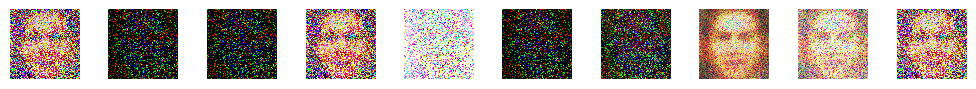

2/2 [==============================] - 0s 22ms/step
Epoch 30/1000, D Loss: 0.3993842154741287, G Loss: 4.090286731719971
2/2 [==============================] - 0s 23ms/step
Epoch 31/1000, D Loss: 0.6515755355358124, G Loss: 5.3241095542907715
2/2 [==============================] - 0s 23ms/step
Epoch 32/1000, D Loss: 3.8296916484832764, G Loss: 2.894977331161499
2/2 [==============================] - 0s 23ms/step
Epoch 33/1000, D Loss: 0.5382940471172333, G Loss: 6.320662021636963
2/2 [==============================] - 0s 23ms/step
Epoch 34/1000, D Loss: 1.118254542350769, G Loss: 3.1186275482177734
2/2 [==============================] - 0s 23ms/step
Epoch 35/1000, D Loss: 0.4275420904159546, G Loss: 4.151760101318359
2/2 [==============================] - 0s 22ms/step
Epoch 36/1000, D Loss: 0.30626188963651657, G Loss: 4.00265645980835
2/2 [==============================] - 0s 23ms/step
Epoch 37/1000, D Loss: 0.8327526748180389, G Loss: 4.2385663986206055
2/2 [=========================

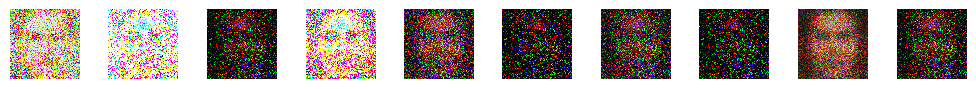

2/2 [==============================] - 0s 22ms/step
Epoch 40/1000, D Loss: 1.5197340846061707, G Loss: 4.931180000305176
2/2 [==============================] - 0s 24ms/step
Epoch 41/1000, D Loss: 2.841582238674164, G Loss: 2.0281319618225098
2/2 [==============================] - 0s 22ms/step
Epoch 42/1000, D Loss: 0.5308726131916046, G Loss: 4.167487621307373
2/2 [==============================] - 0s 23ms/step
Epoch 43/1000, D Loss: 0.19353114441037178, G Loss: 7.227063179016113
2/2 [==============================] - 0s 23ms/step
Epoch 44/1000, D Loss: 0.8340764790773392, G Loss: 6.587666034698486
2/2 [==============================] - 0s 22ms/step
Epoch 45/1000, D Loss: 1.5419197082519531, G Loss: 2.874342679977417
2/2 [==============================] - 0s 24ms/step
Epoch 46/1000, D Loss: 0.8362484574317932, G Loss: 2.8715262413024902
2/2 [==============================] - 0s 22ms/step
Epoch 47/1000, D Loss: 0.46196942031383514, G Loss: 3.502836227416992
2/2 [========================

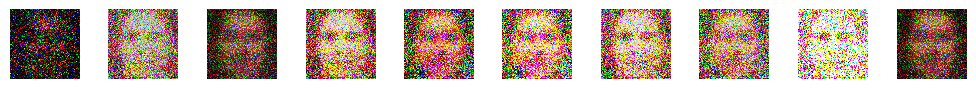

2/2 [==============================] - 0s 22ms/step
Epoch 50/1000, D Loss: 3.590361535549164, G Loss: 2.575071334838867
2/2 [==============================] - 0s 27ms/step
Epoch 51/1000, D Loss: 1.2392514944076538, G Loss: 5.584309101104736
2/2 [==============================] - 0s 22ms/step
Epoch 52/1000, D Loss: 1.0590866804122925, G Loss: 2.510165214538574
2/2 [==============================] - 0s 23ms/step
Epoch 53/1000, D Loss: 0.7712616324424744, G Loss: 3.182326078414917
2/2 [==============================] - 0s 23ms/step
Epoch 54/1000, D Loss: 0.29063141345977783, G Loss: 3.743196487426758
2/2 [==============================] - 0s 24ms/step
Epoch 55/1000, D Loss: 13.282580375671387, G Loss: 9.8359375
2/2 [==============================] - 0s 22ms/step
Epoch 56/1000, D Loss: 5.743813514709473, G Loss: 1.184930443763733
2/2 [==============================] - 0s 24ms/step
Epoch 57/1000, D Loss: 3.96997731924057, G Loss: 3.6401352882385254
2/2 [==============================] - 0s 

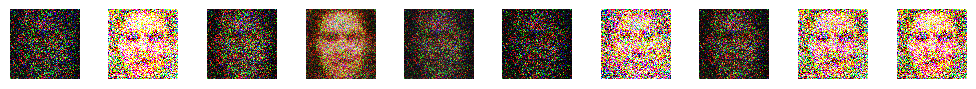

2/2 [==============================] - 0s 24ms/step
Epoch 60/1000, D Loss: 0.9017808511853218, G Loss: 2.4074366092681885
2/2 [==============================] - 0s 23ms/step
Epoch 61/1000, D Loss: 0.9256190955638885, G Loss: 2.100057363510132
2/2 [==============================] - 0s 22ms/step
Epoch 62/1000, D Loss: 0.9990250766277313, G Loss: 2.640242338180542
2/2 [==============================] - 0s 22ms/step
Epoch 63/1000, D Loss: 0.9190642535686493, G Loss: 1.9492114782333374
2/2 [==============================] - 0s 23ms/step
Epoch 64/1000, D Loss: 0.38337913155555725, G Loss: 6.327767372131348
2/2 [==============================] - 0s 23ms/step
Epoch 65/1000, D Loss: 0.4086095094680786, G Loss: 3.670067548751831
2/2 [==============================] - 0s 23ms/step
Epoch 66/1000, D Loss: 1.1302360892295837, G Loss: 3.7943215370178223
2/2 [==============================] - 0s 23ms/step
Epoch 67/1000, D Loss: 1.395137906074524, G Loss: 2.426750421524048
2/2 [========================

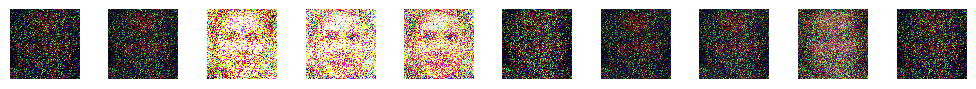

2/2 [==============================] - 0s 25ms/step
Epoch 70/1000, D Loss: 1.0852898359298706, G Loss: 2.1823008060455322
2/2 [==============================] - 0s 23ms/step
Epoch 71/1000, D Loss: 0.44971899688243866, G Loss: 5.686461925506592
2/2 [==============================] - 0s 24ms/step
Epoch 72/1000, D Loss: 2.3192760944366455, G Loss: 1.7151156663894653
2/2 [==============================] - 0s 23ms/step
Epoch 73/1000, D Loss: 1.4351527094841003, G Loss: 1.6061939001083374
2/2 [==============================] - 0s 23ms/step
Epoch 74/1000, D Loss: 0.627471923828125, G Loss: 5.0947980880737305
2/2 [==============================] - 0s 23ms/step
Epoch 75/1000, D Loss: 1.0573936998844147, G Loss: 2.4677553176879883
2/2 [==============================] - 0s 23ms/step
Epoch 76/1000, D Loss: 0.5655181109905243, G Loss: 4.028570652008057
2/2 [==============================] - 0s 23ms/step
Epoch 77/1000, D Loss: 2.3379242420196533, G Loss: 6.614130020141602
2/2 [======================

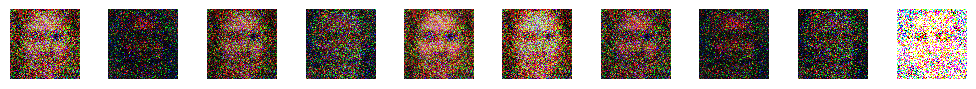

2/2 [==============================] - 0s 23ms/step
Epoch 80/1000, D Loss: 0.8552496433258057, G Loss: 2.9456372261047363
2/2 [==============================] - 0s 23ms/step
Epoch 81/1000, D Loss: 0.565918579697609, G Loss: 5.1957316398620605
2/2 [==============================] - 0s 23ms/step
Epoch 82/1000, D Loss: 0.6366632580757141, G Loss: 6.5846734046936035
2/2 [==============================] - 0s 23ms/step
Epoch 83/1000, D Loss: 1.5145257711410522, G Loss: 2.8116860389709473
2/2 [==============================] - 0s 23ms/step
Epoch 84/1000, D Loss: 1.4135202169418335, G Loss: 1.4488499164581299
2/2 [==============================] - 0s 23ms/step
Epoch 85/1000, D Loss: 2.1776316165924072, G Loss: 1.2001134157180786
2/2 [==============================] - 0s 23ms/step
Epoch 86/1000, D Loss: 0.5602247714996338, G Loss: 2.4054031372070312
2/2 [==============================] - 0s 22ms/step
Epoch 87/1000, D Loss: 0.7675314843654633, G Loss: 2.678190231323242
2/2 [=====================

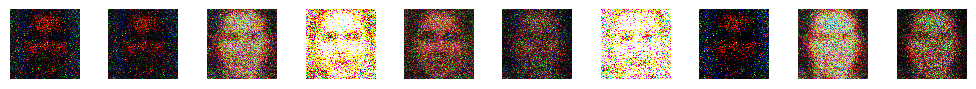

2/2 [==============================] - 0s 22ms/step
Epoch 90/1000, D Loss: 1.2592231333255768, G Loss: 1.5459742546081543
2/2 [==============================] - 0s 23ms/step
Epoch 91/1000, D Loss: 0.5244090259075165, G Loss: 3.1169421672821045
2/2 [==============================] - 0s 29ms/step
Epoch 92/1000, D Loss: 0.6740491688251495, G Loss: 1.821874737739563
2/2 [==============================] - 0s 23ms/step
Epoch 93/1000, D Loss: 0.5882809162139893, G Loss: 1.8095901012420654
2/2 [==============================] - 0s 25ms/step
Epoch 94/1000, D Loss: 0.40494008362293243, G Loss: 4.049018859863281
2/2 [==============================] - 0s 24ms/step
Epoch 95/1000, D Loss: 1.192257583141327, G Loss: 1.1378098726272583
2/2 [==============================] - 0s 27ms/step
Epoch 96/1000, D Loss: 0.9160875976085663, G Loss: 0.9932316541671753
2/2 [==============================] - 0s 25ms/step
Epoch 97/1000, D Loss: 0.9345793128013611, G Loss: 1.1811221837997437
2/2 [=====================

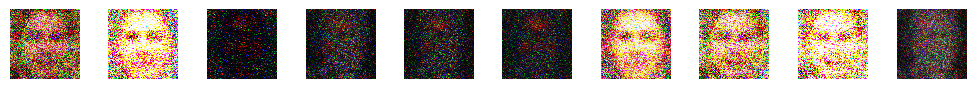

2/2 [==============================] - 0s 23ms/step
Epoch 100/1000, D Loss: 3.045593500137329, G Loss: 0.7678444385528564
2/2 [==============================] - 0s 24ms/step
Epoch 101/1000, D Loss: 0.7443561032414436, G Loss: 1.9646918773651123
2/2 [==============================] - 0s 22ms/step
Epoch 102/1000, D Loss: 1.2775535583496094, G Loss: 1.1098895072937012
2/2 [==============================] - 0s 22ms/step
Epoch 103/1000, D Loss: 0.7907851338386536, G Loss: 1.2382214069366455
2/2 [==============================] - 0s 22ms/step
Epoch 104/1000, D Loss: 0.7461122870445251, G Loss: 2.2685418128967285
2/2 [==============================] - 0s 23ms/step
Epoch 105/1000, D Loss: 0.7854920029640198, G Loss: 2.3176066875457764
2/2 [==============================] - 0s 23ms/step
Epoch 106/1000, D Loss: 0.5076635926961899, G Loss: 2.0373849868774414
2/2 [==============================] - 0s 23ms/step
Epoch 107/1000, D Loss: 1.1655533909797668, G Loss: 0.9734720587730408
2/2 [============

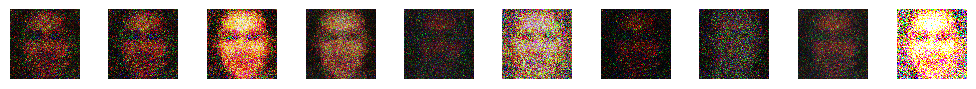

2/2 [==============================] - 0s 24ms/step
Epoch 110/1000, D Loss: 0.9270425736904144, G Loss: 1.134594202041626
2/2 [==============================] - 0s 25ms/step
Epoch 111/1000, D Loss: 0.7299654483795166, G Loss: 1.9694708585739136
2/2 [==============================] - 0s 26ms/step
Epoch 112/1000, D Loss: 0.8992477059364319, G Loss: 1.1795216798782349
2/2 [==============================] - 0s 23ms/step
Epoch 113/1000, D Loss: 0.7632023990154266, G Loss: 1.1852225065231323
2/2 [==============================] - 0s 24ms/step
Epoch 114/1000, D Loss: 0.7584604918956757, G Loss: 1.053884744644165
2/2 [==============================] - 0s 23ms/step
Epoch 115/1000, D Loss: 0.8467870056629181, G Loss: 1.7097010612487793
2/2 [==============================] - 0s 23ms/step
Epoch 116/1000, D Loss: 1.2322651147842407, G Loss: 0.861796498298645
2/2 [==============================] - 0s 23ms/step
Epoch 117/1000, D Loss: 0.7568773925304413, G Loss: 1.0417768955230713
2/2 [==============

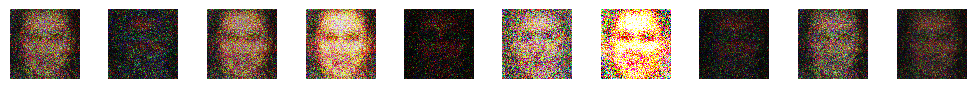

2/2 [==============================] - 0s 22ms/step
Epoch 120/1000, D Loss: 0.8249917328357697, G Loss: 0.7777159214019775
2/2 [==============================] - 0s 24ms/step
Epoch 121/1000, D Loss: 0.7108287513256073, G Loss: 1.117253303527832
2/2 [==============================] - 0s 23ms/step
Epoch 122/1000, D Loss: 1.3405687808990479, G Loss: 0.7358829975128174
2/2 [==============================] - 0s 23ms/step
Epoch 123/1000, D Loss: 0.6964012086391449, G Loss: 0.8239065408706665
2/2 [==============================] - 0s 23ms/step
Epoch 124/1000, D Loss: 0.748299777507782, G Loss: 1.0426936149597168
2/2 [==============================] - 0s 23ms/step
Epoch 125/1000, D Loss: 0.7141405045986176, G Loss: 1.3111927509307861
2/2 [==============================] - 0s 24ms/step
Epoch 126/1000, D Loss: 0.7684221565723419, G Loss: 1.3420695066452026
2/2 [==============================] - 0s 24ms/step
Epoch 127/1000, D Loss: 0.6869905591011047, G Loss: 1.5404788255691528
2/2 [=============

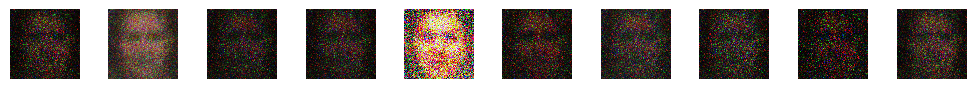

2/2 [==============================] - 0s 22ms/step
Epoch 130/1000, D Loss: 1.0078292489051819, G Loss: 1.5289101600646973
2/2 [==============================] - 0s 22ms/step
Epoch 131/1000, D Loss: 1.3319684863090515, G Loss: 1.0275388956069946
2/2 [==============================] - 0s 22ms/step
Epoch 132/1000, D Loss: 0.8762454688549042, G Loss: 1.0429290533065796
2/2 [==============================] - 0s 22ms/step
Epoch 133/1000, D Loss: 0.8846035003662109, G Loss: 0.9352880120277405
2/2 [==============================] - 0s 23ms/step
Epoch 134/1000, D Loss: 0.782741516828537, G Loss: 0.9642479419708252
2/2 [==============================] - 0s 22ms/step
Epoch 135/1000, D Loss: 0.6614347249269485, G Loss: 2.3221781253814697
2/2 [==============================] - 0s 22ms/step
Epoch 136/1000, D Loss: 1.3544672131538391, G Loss: 1.037041187286377
2/2 [==============================] - 0s 22ms/step
Epoch 137/1000, D Loss: 0.8109425604343414, G Loss: 1.0888742208480835
2/2 [=============

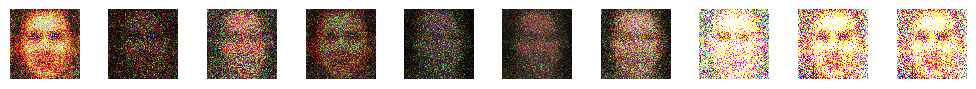

2/2 [==============================] - 0s 22ms/step
Epoch 140/1000, D Loss: 0.6537288278341293, G Loss: 1.3116368055343628
2/2 [==============================] - 0s 22ms/step
Epoch 141/1000, D Loss: 0.7241562008857727, G Loss: 0.9656378030776978
2/2 [==============================] - 0s 24ms/step
Epoch 142/1000, D Loss: 0.7826311886310577, G Loss: 0.9268883466720581
2/2 [==============================] - 0s 22ms/step
Epoch 143/1000, D Loss: 0.7447671294212341, G Loss: 1.1160987615585327
2/2 [==============================] - 0s 22ms/step
Epoch 144/1000, D Loss: 0.8841164112091064, G Loss: 1.0390214920043945
2/2 [==============================] - 0s 23ms/step
Epoch 145/1000, D Loss: 0.7207654416561127, G Loss: 0.896390974521637
2/2 [==============================] - 0s 22ms/step
Epoch 146/1000, D Loss: 0.9437302947044373, G Loss: 0.7359273433685303
2/2 [==============================] - 0s 23ms/step
Epoch 147/1000, D Loss: 0.7366908192634583, G Loss: 0.8583114147186279
2/2 [============

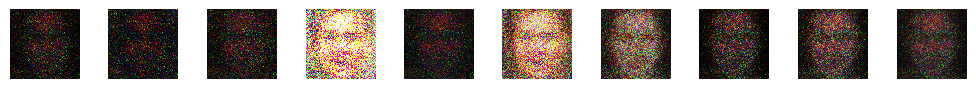

2/2 [==============================] - 0s 22ms/step
Epoch 150/1000, D Loss: 1.1459885239601135, G Loss: 0.8645077347755432
2/2 [==============================] - 0s 22ms/step
Epoch 151/1000, D Loss: 0.8855306804180145, G Loss: 0.907498300075531
2/2 [==============================] - 0s 24ms/step
Epoch 152/1000, D Loss: 0.7557578682899475, G Loss: 0.924022376537323
2/2 [==============================] - 0s 24ms/step
Epoch 153/1000, D Loss: 0.8310283720493317, G Loss: 0.8402996063232422
2/2 [==============================] - 0s 23ms/step
Epoch 154/1000, D Loss: 0.8215659260749817, G Loss: 0.8788430094718933
2/2 [==============================] - 0s 23ms/step
Epoch 155/1000, D Loss: 0.756604790687561, G Loss: 0.8833568692207336
2/2 [==============================] - 0s 25ms/step
Epoch 156/1000, D Loss: 0.9387655556201935, G Loss: 0.7344534993171692
2/2 [==============================] - 0s 22ms/step
Epoch 157/1000, D Loss: 0.8098293244838715, G Loss: 0.9600279927253723
2/2 [==============

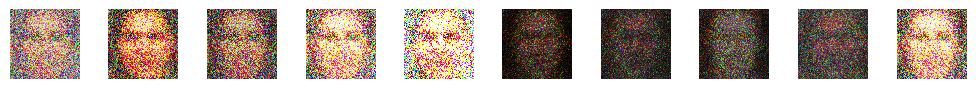

2/2 [==============================] - 0s 22ms/step
Epoch 160/1000, D Loss: 0.6332977414131165, G Loss: 1.0822277069091797
2/2 [==============================] - 0s 23ms/step
Epoch 161/1000, D Loss: 0.7610647082328796, G Loss: 0.9407534599304199
2/2 [==============================] - 0s 25ms/step
Epoch 162/1000, D Loss: 0.7830668091773987, G Loss: 0.932811975479126
2/2 [==============================] - 0s 23ms/step
Epoch 163/1000, D Loss: 0.7705595195293427, G Loss: 1.001017451286316
2/2 [==============================] - 0s 22ms/step
Epoch 164/1000, D Loss: 0.7014549970626831, G Loss: 1.0322237014770508
2/2 [==============================] - 0s 22ms/step
Epoch 165/1000, D Loss: 0.9518304169178009, G Loss: 0.8961886763572693
2/2 [==============================] - 0s 22ms/step
Epoch 166/1000, D Loss: 0.7352908849716187, G Loss: 1.0670535564422607
2/2 [==============================] - 0s 23ms/step
Epoch 167/1000, D Loss: 0.7423747479915619, G Loss: 0.6878858208656311
2/2 [=============

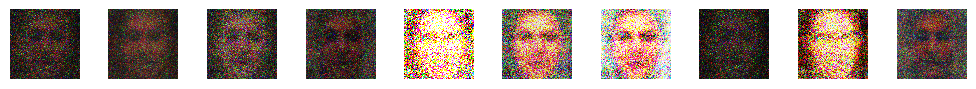

2/2 [==============================] - 0s 23ms/step
Epoch 170/1000, D Loss: 0.7708255052566528, G Loss: 0.7375002503395081
2/2 [==============================] - 0s 22ms/step
Epoch 171/1000, D Loss: 0.7930994629859924, G Loss: 0.8079776167869568
2/2 [==============================] - 0s 25ms/step
Epoch 172/1000, D Loss: 0.7658289968967438, G Loss: 0.8452175259590149
2/2 [==============================] - 0s 27ms/step
Epoch 173/1000, D Loss: 0.918118417263031, G Loss: 0.8642646670341492
2/2 [==============================] - 0s 22ms/step
Epoch 174/1000, D Loss: 0.731496125459671, G Loss: 0.8080599308013916
2/2 [==============================] - 0s 24ms/step
Epoch 175/1000, D Loss: 0.7233400046825409, G Loss: 0.8227105140686035
2/2 [==============================] - 0s 22ms/step
Epoch 176/1000, D Loss: 0.6541308164596558, G Loss: 1.123867392539978
2/2 [==============================] - 0s 22ms/step
Epoch 177/1000, D Loss: 0.7341902554035187, G Loss: 0.8472257852554321
2/2 [==============

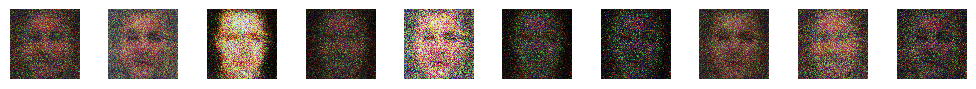

2/2 [==============================] - 0s 23ms/step
Epoch 180/1000, D Loss: 0.7319231033325195, G Loss: 0.8480588793754578
2/2 [==============================] - 0s 22ms/step
Epoch 181/1000, D Loss: 0.6901752054691315, G Loss: 1.6367520093917847
2/2 [==============================] - 0s 23ms/step
Epoch 182/1000, D Loss: 1.027712643146515, G Loss: 0.8005308508872986
2/2 [==============================] - 0s 22ms/step
Epoch 183/1000, D Loss: 0.7603299021720886, G Loss: 0.9010564684867859
2/2 [==============================] - 0s 22ms/step
Epoch 184/1000, D Loss: 0.7654096782207489, G Loss: 0.8331126570701599
2/2 [==============================] - 0s 22ms/step
Epoch 185/1000, D Loss: 0.728356122970581, G Loss: 0.8932257890701294
2/2 [==============================] - 0s 24ms/step
Epoch 186/1000, D Loss: 0.8298876583576202, G Loss: 0.8872238397598267
2/2 [==============================] - 0s 23ms/step
Epoch 187/1000, D Loss: 0.8615155518054962, G Loss: 0.6659145355224609
2/2 [=============

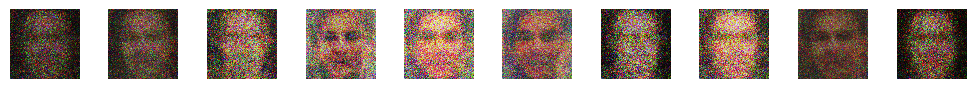

2/2 [==============================] - 0s 22ms/step
Epoch 190/1000, D Loss: 0.7733069062232971, G Loss: 0.7231050133705139
2/2 [==============================] - 0s 23ms/step
Epoch 191/1000, D Loss: 0.7069220542907715, G Loss: 0.8168801665306091
2/2 [==============================] - 0s 22ms/step
Epoch 192/1000, D Loss: 0.8343177735805511, G Loss: 0.7467664480209351
2/2 [==============================] - 0s 23ms/step
Epoch 193/1000, D Loss: 0.7852106690406799, G Loss: 0.8377252221107483
2/2 [==============================] - 0s 22ms/step
Epoch 194/1000, D Loss: 0.8848491907119751, G Loss: 0.7982814908027649
2/2 [==============================] - 0s 22ms/step
Epoch 195/1000, D Loss: 0.8127788305282593, G Loss: 0.7578844428062439
2/2 [==============================] - 0s 22ms/step
Epoch 196/1000, D Loss: 0.7597877383232117, G Loss: 0.8691747188568115
2/2 [==============================] - 0s 22ms/step
Epoch 197/1000, D Loss: 0.7354899942874908, G Loss: 0.7972100973129272
2/2 [===========

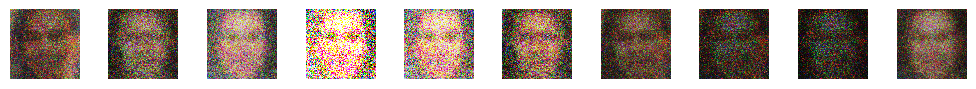

2/2 [==============================] - 0s 22ms/step
Epoch 200/1000, D Loss: 8.595664501190186, G Loss: 3.304281711578369
2/2 [==============================] - 0s 24ms/step
Epoch 201/1000, D Loss: 34.02229928970337, G Loss: 20.138412475585938
2/2 [==============================] - 0s 22ms/step
Epoch 202/1000, D Loss: 52.1842565536499, G Loss: 0.0002900531981140375
2/2 [==============================] - 0s 23ms/step
Epoch 203/1000, D Loss: 5738.217025756836, G Loss: 0.006251050624996424
2/2 [==============================] - 0s 23ms/step
Epoch 204/1000, D Loss: 237.381103515625, G Loss: 26.662416458129883
2/2 [==============================] - 0s 23ms/step
Epoch 205/1000, D Loss: 83.90309445559978, G Loss: 0.2889816164970398
2/2 [==============================] - 0s 22ms/step
Epoch 206/1000, D Loss: 7.15888595581056, G Loss: 22.532304763793945
2/2 [==============================] - 0s 22ms/step
Epoch 207/1000, D Loss: 22.571782112121582, G Loss: 0.2056240290403366
2/2 [=================

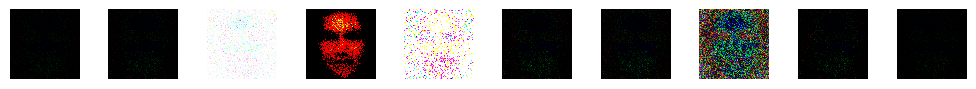

2/2 [==============================] - 0s 22ms/step
Epoch 210/1000, D Loss: 3.893587589264551, G Loss: 7.016416072845459
2/2 [==============================] - 0s 23ms/step
Epoch 211/1000, D Loss: 0.2004188577820969, G Loss: 6.954697132110596
2/2 [==============================] - 0s 22ms/step
Epoch 212/1000, D Loss: 7.718712329864502, G Loss: 6.1802167892456055
2/2 [==============================] - 0s 22ms/step
Epoch 213/1000, D Loss: 10.960091590881348, G Loss: 0.2509109079837799
2/2 [==============================] - 0s 24ms/step
Epoch 214/1000, D Loss: 11.055200576782227, G Loss: 0.16869156062602997
2/2 [==============================] - 0s 22ms/step
Epoch 215/1000, D Loss: 0.3622617684304714, G Loss: 18.24251937866211
2/2 [==============================] - 0s 23ms/step
Epoch 216/1000, D Loss: 4.702363491059227, G Loss: 8.556703567504883
2/2 [==============================] - 0s 22ms/step
Epoch 217/1000, D Loss: 0.3819548077881336, G Loss: 6.647324085235596
2/2 [==================

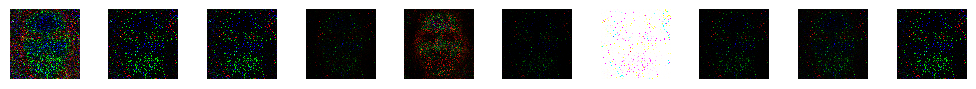

2/2 [==============================] - 0s 22ms/step
Epoch 220/1000, D Loss: 0.4076289087533951, G Loss: 2.7781598567962646
2/2 [==============================] - 0s 23ms/step
Epoch 221/1000, D Loss: 0.4549069330096245, G Loss: 2.8694989681243896
2/2 [==============================] - 0s 22ms/step
Epoch 222/1000, D Loss: 0.3981029763817787, G Loss: 2.3334710597991943
2/2 [==============================] - 0s 22ms/step
Epoch 223/1000, D Loss: 0.3655492588877678, G Loss: 2.90634822845459
2/2 [==============================] - 0s 23ms/step
Epoch 224/1000, D Loss: 1.689511902142677, G Loss: 1.1224050521850586
2/2 [==============================] - 0s 22ms/step
Epoch 225/1000, D Loss: 2.898170732402825, G Loss: 8.33580207824707
2/2 [==============================] - 0s 23ms/step
Epoch 226/1000, D Loss: 0.9312785577221945, G Loss: 4.118176460266113
2/2 [==============================] - 0s 22ms/step
Epoch 227/1000, D Loss: 0.9425180852413177, G Loss: 1.7181899547576904
2/2 [==================

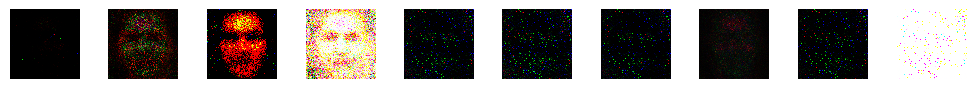

2/2 [==============================] - 0s 23ms/step
Epoch 230/1000, D Loss: 0.4584187790751457, G Loss: 3.138500452041626
2/2 [==============================] - 0s 22ms/step
Epoch 231/1000, D Loss: 0.7839600890874863, G Loss: 6.832852363586426
2/2 [==============================] - 0s 23ms/step
Epoch 232/1000, D Loss: 0.3494531069882214, G Loss: 3.143167734146118
2/2 [==============================] - 0s 22ms/step
Epoch 233/1000, D Loss: 0.24999601719900966, G Loss: 5.033090114593506
2/2 [==============================] - 0s 22ms/step
Epoch 234/1000, D Loss: 0.20360829029232264, G Loss: 4.799046039581299
2/2 [==============================] - 0s 22ms/step
Epoch 235/1000, D Loss: 0.2042861709924182, G Loss: 6.305638313293457
2/2 [==============================] - 0s 22ms/step
Epoch 236/1000, D Loss: 0.16773410141468048, G Loss: 5.089743137359619
2/2 [==============================] - 0s 23ms/step
Epoch 237/1000, D Loss: 0.666137620806694, G Loss: 4.027292251586914
2/2 [=================

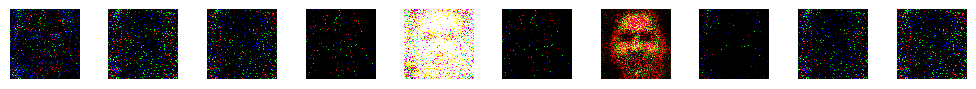

2/2 [==============================] - 0s 22ms/step
Epoch 240/1000, D Loss: 2.5465388894081116, G Loss: 3.828934669494629
2/2 [==============================] - 0s 22ms/step
Epoch 241/1000, D Loss: 0.1144374143332243, G Loss: 5.426650524139404
2/2 [==============================] - 0s 23ms/step
Epoch 242/1000, D Loss: 0.29920871555805206, G Loss: 5.127893447875977
2/2 [==============================] - 0s 22ms/step
Epoch 243/1000, D Loss: 1.7966739237308502, G Loss: 3.1923305988311768
2/2 [==============================] - 0s 23ms/step
Epoch 244/1000, D Loss: 1.962902725837921, G Loss: 4.495823860168457
2/2 [==============================] - 0s 22ms/step
Epoch 245/1000, D Loss: 4.3145012855529785, G Loss: 4.237867832183838
2/2 [==============================] - 0s 23ms/step
Epoch 246/1000, D Loss: 0.253743227571249, G Loss: 9.363092422485352
2/2 [==============================] - 0s 23ms/step
Epoch 247/1000, D Loss: 3.5623674392700195, G Loss: 12.010700225830078
2/2 [==================

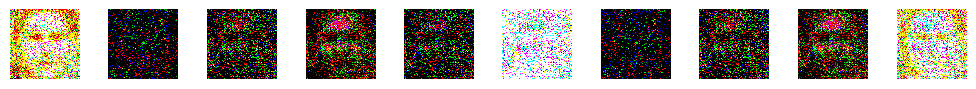

2/2 [==============================] - 0s 23ms/step
Epoch 250/1000, D Loss: 3.3460611701011658, G Loss: 3.335777997970581
2/2 [==============================] - 0s 22ms/step
Epoch 251/1000, D Loss: 1.5633692695046193, G Loss: 6.195955753326416
2/2 [==============================] - 0s 23ms/step
Epoch 252/1000, D Loss: 4.012817978858948, G Loss: 1.9025802612304688
2/2 [==============================] - 0s 22ms/step
Epoch 253/1000, D Loss: 2.6830576062202454, G Loss: 2.1460907459259033
2/2 [==============================] - 0s 22ms/step
Epoch 254/1000, D Loss: 0.04472401097882539, G Loss: 5.728361129760742
2/2 [==============================] - 0s 22ms/step
Epoch 255/1000, D Loss: 0.08319539949297905, G Loss: 4.646481037139893
2/2 [==============================] - 0s 22ms/step
Epoch 256/1000, D Loss: 0.04091537185013294, G Loss: 4.2042131423950195
2/2 [==============================] - 0s 22ms/step
Epoch 257/1000, D Loss: 0.4279380440711975, G Loss: 6.371399402618408
2/2 [==============

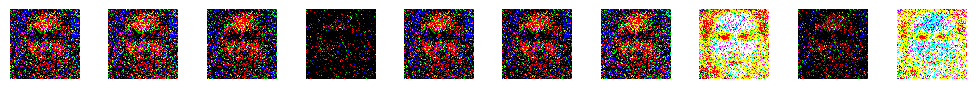

2/2 [==============================] - 0s 23ms/step
Epoch 260/1000, D Loss: 0.04144833981990814, G Loss: 4.223290920257568
2/2 [==============================] - 0s 24ms/step
Epoch 261/1000, D Loss: 0.16463534906506538, G Loss: 5.260700702667236
2/2 [==============================] - 0s 22ms/step
Epoch 262/1000, D Loss: 0.05253912042826414, G Loss: 4.891646862030029
2/2 [==============================] - 0s 22ms/step
Epoch 263/1000, D Loss: 0.06845955923199654, G Loss: 4.153564929962158
2/2 [==============================] - 0s 24ms/step
Epoch 264/1000, D Loss: 0.1186617985367775, G Loss: 4.800443649291992
2/2 [==============================] - 0s 24ms/step
Epoch 265/1000, D Loss: 0.12962279468774796, G Loss: 5.595067024230957
2/2 [==============================] - 0s 22ms/step
Epoch 266/1000, D Loss: 11.09531545639038, G Loss: 0.02247733436524868
2/2 [==============================] - 0s 22ms/step
Epoch 267/1000, D Loss: 3.238241195808574, G Loss: 5.306110382080078
2/2 [==============

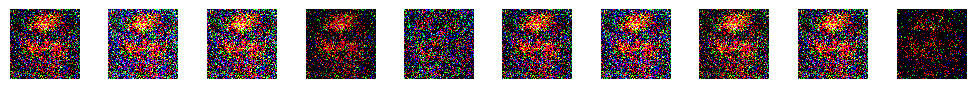

2/2 [==============================] - 0s 25ms/step
Epoch 270/1000, D Loss: 2.1596093177858195, G Loss: 10.468350410461426
2/2 [==============================] - 0s 22ms/step
Epoch 271/1000, D Loss: 1.0513684153556824, G Loss: 4.485777854919434
2/2 [==============================] - 0s 23ms/step
Epoch 272/1000, D Loss: 2.364295870065689, G Loss: 6.526125431060791
2/2 [==============================] - 0s 22ms/step
Epoch 273/1000, D Loss: 0.3778571371238968, G Loss: 9.452495574951172
2/2 [==============================] - 0s 24ms/step
Epoch 274/1000, D Loss: 0.014433325384743512, G Loss: 7.977510452270508
2/2 [==============================] - 0s 22ms/step
Epoch 275/1000, D Loss: 0.012078170198947191, G Loss: 5.327780723571777
2/2 [==============================] - 0s 22ms/step
Epoch 276/1000, D Loss: 0.019801179878413677, G Loss: 5.299006462097168
2/2 [==============================] - 0s 22ms/step
Epoch 277/1000, D Loss: 0.04561012703925371, G Loss: 5.631112098693848
2/2 [============

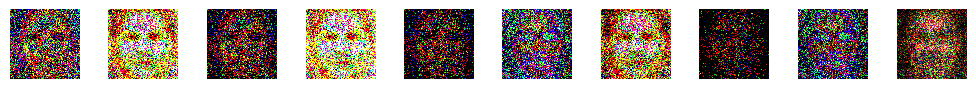

2/2 [==============================] - 0s 23ms/step
Epoch 280/1000, D Loss: 0.23265917599201202, G Loss: 10.29614543914795
2/2 [==============================] - 0s 22ms/step
Epoch 281/1000, D Loss: 8.309422969818115, G Loss: 0.1953221708536148
2/2 [==============================] - 0s 22ms/step
Epoch 282/1000, D Loss: 7.173340559005737, G Loss: 1.9205725193023682
2/2 [==============================] - 0s 22ms/step
Epoch 283/1000, D Loss: 4.432053089141846, G Loss: 8.175324440002441
2/2 [==============================] - 0s 22ms/step
Epoch 284/1000, D Loss: 0.6931682229042053, G Loss: 5.384493350982666
2/2 [==============================] - 0s 23ms/step
Epoch 285/1000, D Loss: 0.010487179504707456, G Loss: 5.263883113861084
2/2 [==============================] - 0s 22ms/step
Epoch 286/1000, D Loss: 0.019660447258502245, G Loss: 6.409885406494141
2/2 [==============================] - 0s 22ms/step
Epoch 287/1000, D Loss: 0.03459893446415663, G Loss: 5.6681599617004395
2/2 [=============

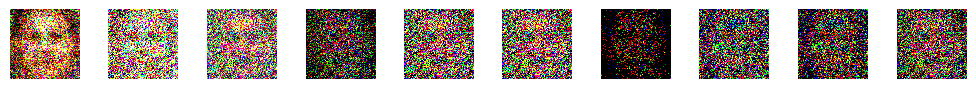

2/2 [==============================] - 0s 23ms/step
Epoch 290/1000, D Loss: 1.1101241311316699, G Loss: 24.355173110961914
2/2 [==============================] - 0s 23ms/step
Epoch 291/1000, D Loss: 10.687385320663452, G Loss: 12.983861923217773
2/2 [==============================] - 0s 22ms/step
Epoch 292/1000, D Loss: 1.3511158238527838, G Loss: 27.460010528564453
2/2 [==============================] - 0s 22ms/step
Epoch 293/1000, D Loss: 0.033531336070154794, G Loss: 10.867300033569336
2/2 [==============================] - 0s 23ms/step
Epoch 294/1000, D Loss: 0.06508197914808989, G Loss: 6.788253307342529
2/2 [==============================] - 0s 22ms/step
Epoch 295/1000, D Loss: 0.07195165939629078, G Loss: 4.552709579467773
2/2 [==============================] - 0s 22ms/step
Epoch 296/1000, D Loss: 0.18814628943800926, G Loss: 7.358465671539307
2/2 [==============================] - 0s 23ms/step
Epoch 297/1000, D Loss: 6.040830850601196, G Loss: 5.7084808349609375
2/2 [==========

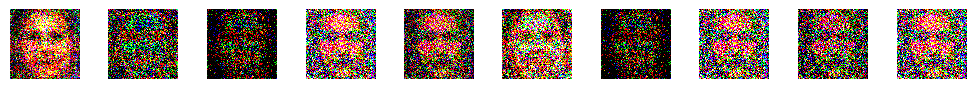

2/2 [==============================] - 0s 22ms/step
Epoch 300/1000, D Loss: 0.1597994564799592, G Loss: 8.156682968139648
2/2 [==============================] - 0s 22ms/step
Epoch 301/1000, D Loss: 0.04343067808076739, G Loss: 6.62464714050293
2/2 [==============================] - 0s 22ms/step
Epoch 302/1000, D Loss: 0.034149459563195705, G Loss: 5.1330695152282715
2/2 [==============================] - 0s 22ms/step
Epoch 303/1000, D Loss: 0.042752369306981564, G Loss: 5.1961894035339355
2/2 [==============================] - 0s 24ms/step
Epoch 304/1000, D Loss: 0.05809247866272926, G Loss: 5.4532575607299805
2/2 [==============================] - 0s 22ms/step
Epoch 305/1000, D Loss: 0.05409982055425644, G Loss: 5.532806873321533
2/2 [==============================] - 0s 22ms/step
Epoch 306/1000, D Loss: 7.496009826660156, G Loss: 6.45022439956665
2/2 [==============================] - 0s 22ms/step
Epoch 307/1000, D Loss: 0.07409295788966119, G Loss: 10.903193473815918
2/2 [==========

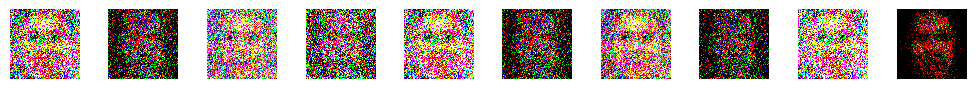

2/2 [==============================] - 0s 22ms/step
Epoch 310/1000, D Loss: 0.0406913673505187, G Loss: 4.423018932342529
2/2 [==============================] - 0s 22ms/step
Epoch 311/1000, D Loss: 0.04297475330531597, G Loss: 4.5427703857421875
2/2 [==============================] - 0s 22ms/step
Epoch 312/1000, D Loss: 0.08504628390073776, G Loss: 4.064660549163818
2/2 [==============================] - 0s 23ms/step
Epoch 313/1000, D Loss: 0.07156570255756378, G Loss: 5.082696437835693
2/2 [==============================] - 0s 22ms/step
Epoch 314/1000, D Loss: 0.05671253800392151, G Loss: 4.099759101867676
2/2 [==============================] - 0s 22ms/step
Epoch 315/1000, D Loss: 0.040770549327135086, G Loss: 4.382965087890625
2/2 [==============================] - 0s 23ms/step
Epoch 316/1000, D Loss: 0.05398610793054104, G Loss: 4.071304798126221
2/2 [==============================] - 0s 22ms/step
Epoch 317/1000, D Loss: 0.04800435155630112, G Loss: 4.264383316040039
2/2 [==========

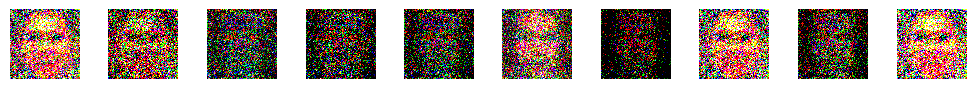

2/2 [==============================] - 0s 23ms/step
Epoch 320/1000, D Loss: 0.03305483236908913, G Loss: 4.370389461517334
2/2 [==============================] - 0s 23ms/step
Epoch 321/1000, D Loss: 0.04992423579096794, G Loss: 4.4520344734191895
2/2 [==============================] - 0s 22ms/step
Epoch 322/1000, D Loss: 0.036225964315235615, G Loss: 4.297744274139404
2/2 [==============================] - 0s 23ms/step
Epoch 323/1000, D Loss: 0.034231324680149555, G Loss: 4.124803066253662
2/2 [==============================] - 0s 22ms/step
Epoch 324/1000, D Loss: 0.034383783116936684, G Loss: 4.637114524841309
2/2 [==============================] - 0s 22ms/step
Epoch 325/1000, D Loss: 0.05574997887015343, G Loss: 4.2241387367248535
2/2 [==============================] - 0s 22ms/step
Epoch 326/1000, D Loss: 0.038375914096832275, G Loss: 4.360137939453125
2/2 [==============================] - 0s 23ms/step
Epoch 327/1000, D Loss: 0.03628290072083473, G Loss: 4.407215595245361
2/2 [=====

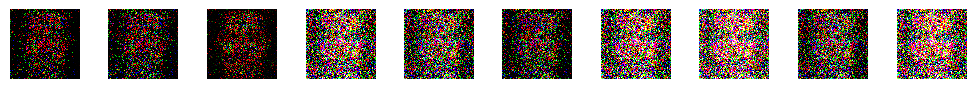

2/2 [==============================] - 0s 23ms/step
Epoch 330/1000, D Loss: 0.03308985102921724, G Loss: 4.567553520202637
2/2 [==============================] - 0s 22ms/step
Epoch 331/1000, D Loss: 0.04783899150788784, G Loss: 4.146088600158691
2/2 [==============================] - 0s 22ms/step
Epoch 332/1000, D Loss: 0.053693220019340515, G Loss: 4.372818470001221
2/2 [==============================] - 0s 22ms/step
Epoch 333/1000, D Loss: 0.03693911526352167, G Loss: 4.555875778198242
2/2 [==============================] - 0s 22ms/step
Epoch 334/1000, D Loss: 0.0732237882912159, G Loss: 4.421057224273682
2/2 [==============================] - 0s 22ms/step
Epoch 335/1000, D Loss: 0.0381633173674345, G Loss: 5.483176231384277
2/2 [==============================] - 0s 22ms/step
Epoch 336/1000, D Loss: 0.02927394211292267, G Loss: 4.1864399909973145
2/2 [==============================] - 0s 22ms/step
Epoch 337/1000, D Loss: 0.02388080582022667, G Loss: 4.5036234855651855
2/2 [==========

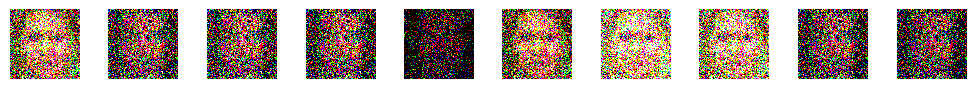

2/2 [==============================] - 0s 22ms/step
Epoch 340/1000, D Loss: 0.03929668106138706, G Loss: 4.345654487609863
2/2 [==============================] - 0s 22ms/step
Epoch 341/1000, D Loss: 11.330552577972412, G Loss: 0.10884476453065872
2/2 [==============================] - 0s 23ms/step
Epoch 342/1000, D Loss: 2.5457947333742252, G Loss: 7.376931667327881
2/2 [==============================] - 0s 22ms/step
Epoch 343/1000, D Loss: 1.4041220202696856, G Loss: 6.010168075561523
2/2 [==============================] - 0s 23ms/step
Epoch 344/1000, D Loss: 0.6856943517923355, G Loss: 8.238361358642578
2/2 [==============================] - 0s 23ms/step
Epoch 345/1000, D Loss: 0.013353139394894242, G Loss: 10.759015083312988
2/2 [==============================] - 0s 23ms/step
Epoch 346/1000, D Loss: 0.024597175419330597, G Loss: 8.612381935119629
2/2 [==============================] - 0s 23ms/step
Epoch 347/1000, D Loss: 0.018343644216656685, G Loss: 7.594688892364502
2/2 [=========

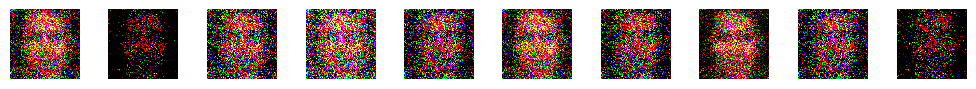

2/2 [==============================] - 0s 23ms/step
Epoch 350/1000, D Loss: 0.027001569978892803, G Loss: 4.17709493637085
2/2 [==============================] - 0s 22ms/step
Epoch 351/1000, D Loss: 0.08067846670746803, G Loss: 3.7869789600372314
2/2 [==============================] - 0s 22ms/step
Epoch 352/1000, D Loss: 0.046143192797899246, G Loss: 4.2017059326171875
2/2 [==============================] - 0s 22ms/step
Epoch 353/1000, D Loss: 0.054845042526721954, G Loss: 3.9945218563079834
2/2 [==============================] - 0s 23ms/step
Epoch 354/1000, D Loss: 0.05579494684934616, G Loss: 3.9196996688842773
2/2 [==============================] - 0s 23ms/step
Epoch 355/1000, D Loss: 0.20789997279644012, G Loss: 4.176857948303223
2/2 [==============================] - 0s 22ms/step
Epoch 356/1000, D Loss: 0.0505132507532835, G Loss: 3.812293291091919
2/2 [==============================] - 0s 24ms/step
Epoch 357/1000, D Loss: 0.14976633340120316, G Loss: 4.852619171142578
2/2 [======

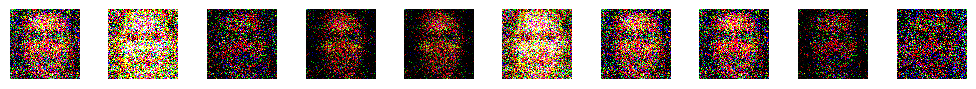

2/2 [==============================] - 0s 23ms/step
Epoch 360/1000, D Loss: 1.6260687308119017, G Loss: 10.499272346496582
2/2 [==============================] - 0s 22ms/step
Epoch 361/1000, D Loss: 0.013994240900501609, G Loss: 12.064414024353027
2/2 [==============================] - 0s 22ms/step
Epoch 362/1000, D Loss: 0.021772704320028424, G Loss: 7.338073253631592
2/2 [==============================] - 0s 22ms/step
Epoch 363/1000, D Loss: 0.024638047441840172, G Loss: 5.475448131561279
2/2 [==============================] - 0s 23ms/step
Epoch 364/1000, D Loss: 0.07347551360726357, G Loss: 4.371224880218506
2/2 [==============================] - 0s 22ms/step
Epoch 365/1000, D Loss: 0.04605232644826174, G Loss: 4.591582298278809
2/2 [==============================] - 0s 22ms/step
Epoch 366/1000, D Loss: 6.224176347255707, G Loss: 8.916315078735352
2/2 [==============================] - 0s 22ms/step
Epoch 367/1000, D Loss: 0.0035446735273581, G Loss: 20.9156436920166
2/2 [===========

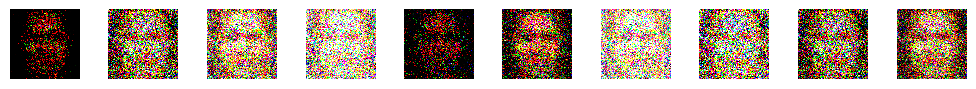

2/2 [==============================] - 0s 22ms/step
Epoch 370/1000, D Loss: 0.5707863859109352, G Loss: 26.081310272216797
2/2 [==============================] - 0s 22ms/step
Epoch 371/1000, D Loss: 11.746620178222656, G Loss: 8.500102043151855
2/2 [==============================] - 0s 22ms/step
Epoch 372/1000, D Loss: 8.851544737815857, G Loss: 1.8863770961761475
2/2 [==============================] - 0s 22ms/step
Epoch 373/1000, D Loss: 0.12806414449732983, G Loss: 12.22134017944336
2/2 [==============================] - 0s 22ms/step
Epoch 374/1000, D Loss: 0.06262161675840616, G Loss: 8.087640762329102
2/2 [==============================] - 0s 22ms/step
Epoch 375/1000, D Loss: 0.1404373124241829, G Loss: 6.267125129699707
2/2 [==============================] - 0s 22ms/step
Epoch 376/1000, D Loss: 4.183095097541809, G Loss: 2.82047176361084
2/2 [==============================] - 0s 22ms/step
Epoch 377/1000, D Loss: 0.03839228139258921, G Loss: 14.132061004638672
2/2 [================

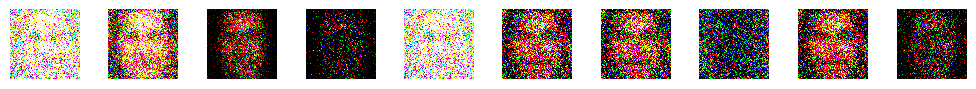

2/2 [==============================] - 0s 22ms/step
Epoch 380/1000, D Loss: 0.004068767128046602, G Loss: 19.177654266357422
2/2 [==============================] - 0s 22ms/step
Epoch 381/1000, D Loss: 6.273388862609863, G Loss: 5.7078633308410645
2/2 [==============================] - 0s 22ms/step
Epoch 382/1000, D Loss: 0.04592485446482897, G Loss: 8.078289985656738
2/2 [==============================] - 0s 23ms/step
Epoch 383/1000, D Loss: 0.045417013112455606, G Loss: 5.555113315582275
2/2 [==============================] - 0s 22ms/step
Epoch 384/1000, D Loss: 10.837664127349854, G Loss: 1.5256251096725464
2/2 [==============================] - 0s 22ms/step
Epoch 385/1000, D Loss: 1.3940108398824123, G Loss: 59.981746673583984
2/2 [==============================] - 0s 24ms/step
Epoch 386/1000, D Loss: 5.161985695362091, G Loss: 2.390571355819702
2/2 [==============================] - 0s 23ms/step
Epoch 387/1000, D Loss: 0.061105276457965374, G Loss: 5.124683380126953
2/2 [==========

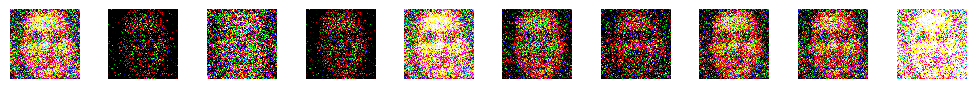

2/2 [==============================] - 0s 23ms/step
Epoch 390/1000, D Loss: 0.07659871503710747, G Loss: 5.489163875579834
2/2 [==============================] - 0s 23ms/step
Epoch 391/1000, D Loss: 0.1445883996784687, G Loss: 11.73695182800293
2/2 [==============================] - 0s 22ms/step
Epoch 392/1000, D Loss: 5.246086120605469, G Loss: 1.871652364730835
2/2 [==============================] - 0s 24ms/step
Epoch 393/1000, D Loss: 0.008209787774831057, G Loss: 14.378632545471191
2/2 [==============================] - 0s 22ms/step
Epoch 394/1000, D Loss: 7.396018147468567, G Loss: 0.8475236296653748
2/2 [==============================] - 0s 22ms/step
Epoch 395/1000, D Loss: 0.03754522290546447, G Loss: 12.336703300476074
2/2 [==============================] - 0s 24ms/step
Epoch 396/1000, D Loss: 0.07100070081651211, G Loss: 5.138449192047119
2/2 [==============================] - 0s 22ms/step
Epoch 397/1000, D Loss: 0.1294105462729931, G Loss: 4.084413528442383
2/2 [=============

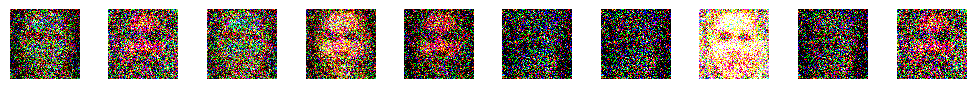

2/2 [==============================] - 0s 22ms/step
Epoch 400/1000, D Loss: 0.21423165500164032, G Loss: 13.579636573791504
2/2 [==============================] - 0s 23ms/step
Epoch 401/1000, D Loss: 3.5535836219787598, G Loss: 2.8126778602600098
2/2 [==============================] - 0s 22ms/step
Epoch 402/1000, D Loss: 0.10980970785021782, G Loss: 5.168103218078613
2/2 [==============================] - 0s 22ms/step
Epoch 403/1000, D Loss: 0.18869079649448395, G Loss: 4.333844184875488
2/2 [==============================] - 0s 23ms/step
Epoch 404/1000, D Loss: 0.21475699543952942, G Loss: 4.235305309295654
2/2 [==============================] - 0s 22ms/step
Epoch 405/1000, D Loss: 0.09738646820187569, G Loss: 4.256921291351318
2/2 [==============================] - 0s 22ms/step
Epoch 406/1000, D Loss: 0.3378893658518791, G Loss: 5.119385242462158
2/2 [==============================] - 0s 26ms/step
Epoch 407/1000, D Loss: 0.05321062356233597, G Loss: 4.182504653930664
2/2 [===========

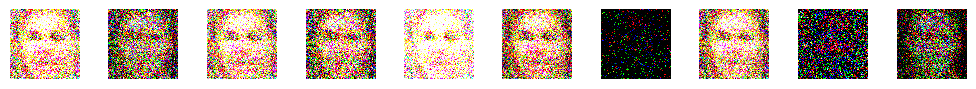

2/2 [==============================] - 0s 21ms/step
Epoch 410/1000, D Loss: 0.072791438549757, G Loss: 4.409238338470459
2/2 [==============================] - 0s 22ms/step
Epoch 411/1000, D Loss: 6.8722028732299805, G Loss: 0.3643474280834198
2/2 [==============================] - 0s 22ms/step
Epoch 412/1000, D Loss: 0.07785542216151953, G Loss: 5.38895320892334
2/2 [==============================] - 0s 23ms/step
Epoch 413/1000, D Loss: 0.06054502911865711, G Loss: 4.075566291809082
2/2 [==============================] - 0s 22ms/step
Epoch 414/1000, D Loss: 0.05734418146312237, G Loss: 3.892124652862549
2/2 [==============================] - 0s 22ms/step
Epoch 415/1000, D Loss: 0.06610234268009663, G Loss: 4.203218460083008
2/2 [==============================] - 0s 22ms/step
Epoch 416/1000, D Loss: 0.07037622109055519, G Loss: 4.917932510375977
2/2 [==============================] - 0s 22ms/step
Epoch 417/1000, D Loss: 0.07350775599479675, G Loss: 4.125666618347168
2/2 [==============

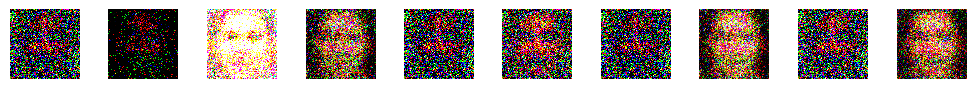

2/2 [==============================] - 0s 22ms/step
Epoch 420/1000, D Loss: 0.032289672177284956, G Loss: 5.3807268142700195
2/2 [==============================] - 0s 23ms/step
Epoch 421/1000, D Loss: 0.03544962219893932, G Loss: 4.585432529449463
2/2 [==============================] - 0s 22ms/step
Epoch 422/1000, D Loss: 0.04576348327100277, G Loss: 4.241559028625488
2/2 [==============================] - 0s 24ms/step
Epoch 423/1000, D Loss: 0.09550657495856285, G Loss: 4.48870849609375
2/2 [==============================] - 0s 22ms/step
Epoch 424/1000, D Loss: 0.24493467644788325, G Loss: 7.071829319000244
2/2 [==============================] - 0s 23ms/step
Epoch 425/1000, D Loss: 0.02824607864022255, G Loss: 5.391716480255127
2/2 [==============================] - 0s 22ms/step
Epoch 426/1000, D Loss: 0.03223078232258558, G Loss: 4.416384696960449
2/2 [==============================] - 0s 22ms/step
Epoch 427/1000, D Loss: 0.03865169547498226, G Loss: 3.8882079124450684
2/2 [=========

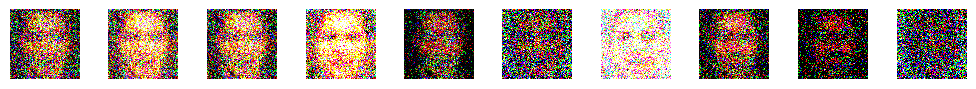

2/2 [==============================] - 0s 23ms/step
Epoch 430/1000, D Loss: 13.618409276008606, G Loss: 0.05275747925043106
2/2 [==============================] - 0s 23ms/step
Epoch 431/1000, D Loss: 0.09427137859165668, G Loss: 4.784870147705078
2/2 [==============================] - 0s 22ms/step
Epoch 432/1000, D Loss: 0.047070218381122686, G Loss: 8.187067031860352
2/2 [==============================] - 0s 26ms/step
Epoch 433/1000, D Loss: 0.05421245004981756, G Loss: 7.068320274353027
2/2 [==============================] - 0s 22ms/step
Epoch 434/1000, D Loss: 0.039244625717401505, G Loss: 6.132396221160889
2/2 [==============================] - 0s 22ms/step
Epoch 435/1000, D Loss: 0.7537811249494553, G Loss: 9.524062156677246
2/2 [==============================] - 0s 23ms/step
Epoch 436/1000, D Loss: 0.9023108184337616, G Loss: 4.976556301116943
2/2 [==============================] - 0s 22ms/step
Epoch 437/1000, D Loss: 0.024302723817527294, G Loss: 6.206368446350098
2/2 [=========

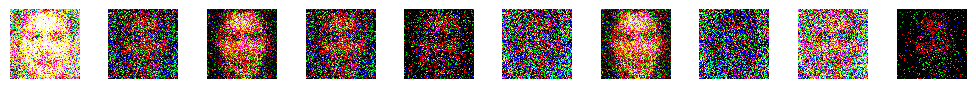

2/2 [==============================] - 0s 23ms/step
Epoch 440/1000, D Loss: 0.6279276013374329, G Loss: 6.213547229766846
2/2 [==============================] - 0s 24ms/step
Epoch 441/1000, D Loss: 0.0381115498021245, G Loss: 4.849184513092041
2/2 [==============================] - 0s 22ms/step
Epoch 442/1000, D Loss: 0.030888229608535767, G Loss: 4.471417427062988
2/2 [==============================] - 0s 23ms/step
Epoch 443/1000, D Loss: 0.05789581313729286, G Loss: 4.914429664611816
2/2 [==============================] - 0s 22ms/step
Epoch 444/1000, D Loss: 0.02635612804442644, G Loss: 6.333021640777588
2/2 [==============================] - 0s 23ms/step
Epoch 445/1000, D Loss: 5.0634989738464355, G Loss: 1.632736086845398
2/2 [==============================] - 0s 22ms/step
Epoch 446/1000, D Loss: 0.025912062264978886, G Loss: 4.608548641204834
2/2 [==============================] - 0s 23ms/step
Epoch 447/1000, D Loss: 0.024316922761499882, G Loss: 4.555358409881592
2/2 [===========

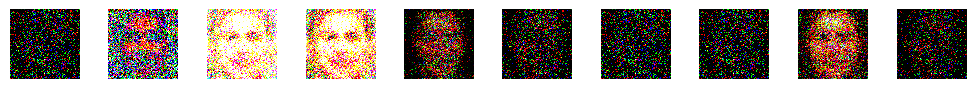

2/2 [==============================] - 0s 22ms/step
Epoch 450/1000, D Loss: 0.4322548285126686, G Loss: 22.313220977783203
2/2 [==============================] - 0s 22ms/step
Epoch 451/1000, D Loss: 0.0042359239523648284, G Loss: 15.925498008728027
2/2 [==============================] - 0s 22ms/step
Epoch 452/1000, D Loss: 15.157275836914778, G Loss: 1.6261589527130127
2/2 [==============================] - 0s 22ms/step
Epoch 453/1000, D Loss: 0.18697667494416237, G Loss: 8.598779678344727
2/2 [==============================] - 0s 22ms/step
Epoch 454/1000, D Loss: 0.11670174449682236, G Loss: 9.034104347229004
2/2 [==============================] - 0s 23ms/step
Epoch 455/1000, D Loss: 5.53233677148819, G Loss: 3.336165428161621
2/2 [==============================] - 0s 23ms/step
Epoch 456/1000, D Loss: 0.1706491547083715, G Loss: 14.414841651916504
2/2 [==============================] - 0s 22ms/step
Epoch 457/1000, D Loss: 0.08189248107373714, G Loss: 10.166533470153809
2/2 [==========

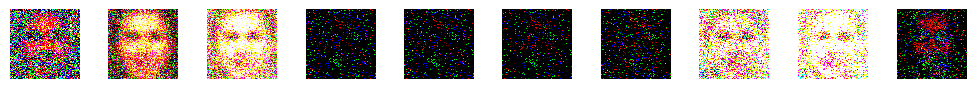

2/2 [==============================] - 0s 22ms/step
Epoch 460/1000, D Loss: 2.796088367700577, G Loss: 3.3770558834075928
2/2 [==============================] - 0s 23ms/step
Epoch 461/1000, D Loss: 0.13813785556703806, G Loss: 10.053085327148438
2/2 [==============================] - 0s 22ms/step
Epoch 462/1000, D Loss: 6.934570550918579, G Loss: 1.0688214302062988
2/2 [==============================] - 0s 22ms/step
Epoch 463/1000, D Loss: 0.720874763908796, G Loss: 9.737183570861816
2/2 [==============================] - 0s 23ms/step
Epoch 464/1000, D Loss: 0.37454937398433685, G Loss: 5.279453277587891
2/2 [==============================] - 0s 22ms/step
Epoch 465/1000, D Loss: 0.13618974387645721, G Loss: 5.8695068359375
2/2 [==============================] - 0s 22ms/step
Epoch 466/1000, D Loss: 0.2528759939596057, G Loss: 8.53812026977539
2/2 [==============================] - 0s 22ms/step
Epoch 467/1000, D Loss: 4.534376621246338, G Loss: 2.850003957748413
2/2 [====================

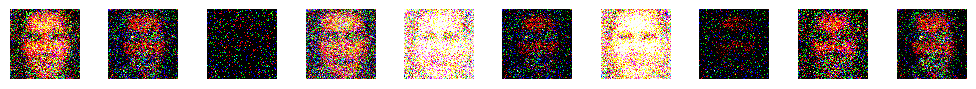

2/2 [==============================] - 0s 22ms/step
Epoch 470/1000, D Loss: 0.059725336730480194, G Loss: 5.950849533081055
2/2 [==============================] - 0s 22ms/step
Epoch 471/1000, D Loss: 0.08216079510748386, G Loss: 4.92690372467041
2/2 [==============================] - 0s 22ms/step
Epoch 472/1000, D Loss: 0.0416167713701725, G Loss: 4.324174880981445
2/2 [==============================] - 0s 23ms/step
Epoch 473/1000, D Loss: 0.11666522547602654, G Loss: 4.882022857666016
2/2 [==============================] - 0s 22ms/step
Epoch 474/1000, D Loss: 0.8583341240882874, G Loss: 25.048398971557617
2/2 [==============================] - 0s 22ms/step
Epoch 475/1000, D Loss: 5.168231248855591, G Loss: 4.223055839538574
2/2 [==============================] - 0s 27ms/step
Epoch 476/1000, D Loss: 1.038604713510722, G Loss: 13.639904022216797
2/2 [==============================] - 0s 22ms/step
Epoch 477/1000, D Loss: 0.5513091832399368, G Loss: 2.3801498413085938
2/2 [===============

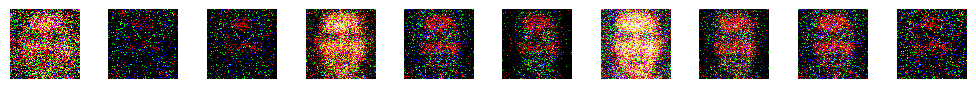

2/2 [==============================] - 0s 23ms/step
Epoch 480/1000, D Loss: 0.054063681280240417, G Loss: 4.979416370391846
2/2 [==============================] - 0s 22ms/step
Epoch 481/1000, D Loss: 0.050122213549911976, G Loss: 4.7959513664245605
2/2 [==============================] - 0s 22ms/step
Epoch 482/1000, D Loss: 0.18022093176841736, G Loss: 5.604859828948975
2/2 [==============================] - 0s 22ms/step
Epoch 483/1000, D Loss: 0.21513555105775595, G Loss: 6.765954494476318
2/2 [==============================] - 0s 22ms/step
Epoch 484/1000, D Loss: 3.240578770637512, G Loss: 3.582981586456299
2/2 [==============================] - 0s 22ms/step
Epoch 485/1000, D Loss: 0.05081420112401247, G Loss: 9.380838394165039
2/2 [==============================] - 0s 24ms/step
Epoch 486/1000, D Loss: 1.1845765709877014, G Loss: 9.358709335327148
2/2 [==============================] - 0s 23ms/step
Epoch 487/1000, D Loss: 0.013521647546440363, G Loss: 11.893856048583984
2/2 [=========

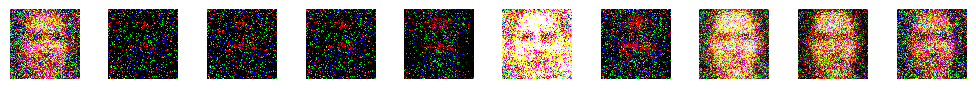

2/2 [==============================] - 0s 23ms/step
Epoch 490/1000, D Loss: 0.035281174816191196, G Loss: 8.327439308166504
2/2 [==============================] - 0s 22ms/step
Epoch 491/1000, D Loss: 0.7385631501674652, G Loss: 5.222982406616211
2/2 [==============================] - 0s 22ms/step
Epoch 492/1000, D Loss: 0.8217057883739471, G Loss: 8.798312187194824
2/2 [==============================] - 0s 23ms/step
Epoch 493/1000, D Loss: 1.8503292798995972, G Loss: 3.2870492935180664
2/2 [==============================] - 0s 22ms/step
Epoch 494/1000, D Loss: 0.09125801920890808, G Loss: 3.880481481552124
2/2 [==============================] - 0s 23ms/step
Epoch 495/1000, D Loss: 0.1756858080625534, G Loss: 4.340253829956055
2/2 [==============================] - 0s 22ms/step
Epoch 496/1000, D Loss: 0.2766833081841469, G Loss: 12.161971092224121
2/2 [==============================] - 0s 22ms/step
Epoch 497/1000, D Loss: 2.9749436527490616, G Loss: 2.3215205669403076
2/2 [=============

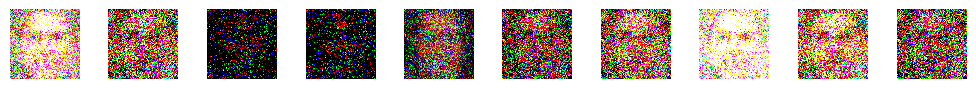

2/2 [==============================] - 0s 22ms/step
Epoch 500/1000, D Loss: 0.19031310454010963, G Loss: 3.080981969833374
2/2 [==============================] - 0s 22ms/step
Epoch 501/1000, D Loss: 0.13016175478696823, G Loss: 3.9243667125701904
2/2 [==============================] - 0s 22ms/step
Epoch 502/1000, D Loss: 3.6040722131729126, G Loss: 1.4422619342803955
2/2 [==============================] - 0s 23ms/step
Epoch 503/1000, D Loss: 0.1455767098814249, G Loss: 4.422436237335205
2/2 [==============================] - 0s 22ms/step
Epoch 504/1000, D Loss: 0.13949066400527954, G Loss: 4.416082382202148
2/2 [==============================] - 0s 22ms/step
Epoch 505/1000, D Loss: 0.12156146392226219, G Loss: 5.1467509269714355
2/2 [==============================] - 0s 23ms/step
Epoch 506/1000, D Loss: 0.15737860277295113, G Loss: 8.52993392944336
2/2 [==============================] - 0s 24ms/step
Epoch 507/1000, D Loss: 1.88783198595047, G Loss: 2.6634578704833984
2/2 [=============

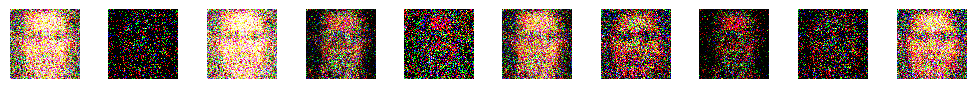

2/2 [==============================] - 0s 23ms/step
Epoch 510/1000, D Loss: 0.12050429359078407, G Loss: 4.3794636726379395
2/2 [==============================] - 0s 23ms/step
Epoch 511/1000, D Loss: 4.336501121520996, G Loss: 0.5748679041862488
2/2 [==============================] - 0s 22ms/step
Epoch 512/1000, D Loss: 0.11364634707570076, G Loss: 6.621160984039307
2/2 [==============================] - 0s 23ms/step
Epoch 513/1000, D Loss: 0.07598179392516613, G Loss: 3.7719902992248535
2/2 [==============================] - 0s 22ms/step
Epoch 514/1000, D Loss: 0.06653304025530815, G Loss: 3.9931893348693848
2/2 [==============================] - 0s 22ms/step
Epoch 515/1000, D Loss: 0.08833272010087967, G Loss: 4.487634181976318
2/2 [==============================] - 0s 22ms/step
Epoch 516/1000, D Loss: 0.31534238904714584, G Loss: 39.04157638549805
2/2 [==============================] - 0s 22ms/step
Epoch 517/1000, D Loss: 12.628309816122055, G Loss: 1.4367856979370117
2/2 [=========

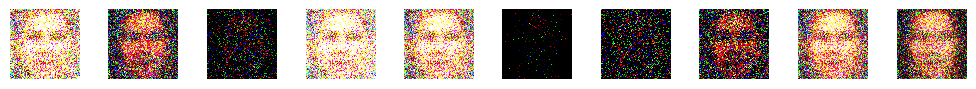

2/2 [==============================] - 0s 24ms/step
Epoch 520/1000, D Loss: 1.697607547044754, G Loss: 5.7058329582214355
2/2 [==============================] - 0s 22ms/step
Epoch 521/1000, D Loss: 0.15264896303415298, G Loss: 5.229314804077148
2/2 [==============================] - 0s 22ms/step
Epoch 522/1000, D Loss: 0.345389723777771, G Loss: 4.950252532958984
2/2 [==============================] - 0s 23ms/step
Epoch 523/1000, D Loss: 0.6261072754859924, G Loss: 8.508345603942871
2/2 [==============================] - 0s 23ms/step
Epoch 524/1000, D Loss: 1.5009028911590576, G Loss: 2.9245057106018066
2/2 [==============================] - 0s 22ms/step
Epoch 525/1000, D Loss: 0.24643952026963234, G Loss: 3.8320767879486084
2/2 [==============================] - 0s 24ms/step
Epoch 526/1000, D Loss: 0.10423695296049118, G Loss: 3.562699794769287
2/2 [==============================] - 0s 23ms/step
Epoch 527/1000, D Loss: 2.1408591866493225, G Loss: 10.350613594055176
2/2 [==============

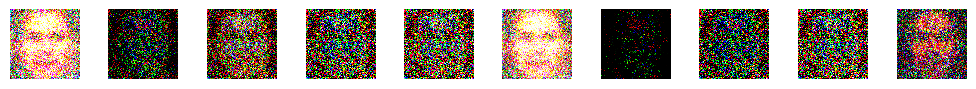

2/2 [==============================] - 0s 24ms/step
Epoch 530/1000, D Loss: 0.08870317786931992, G Loss: 3.401609420776367
2/2 [==============================] - 0s 22ms/step
Epoch 531/1000, D Loss: 0.12020796537399292, G Loss: 3.972445487976074
2/2 [==============================] - 0s 26ms/step
Epoch 532/1000, D Loss: 3.719586133956909, G Loss: 1.4396247863769531
2/2 [==============================] - 0s 23ms/step
Epoch 533/1000, D Loss: 0.04355793120339513, G Loss: 7.918720722198486
2/2 [==============================] - 0s 23ms/step
Epoch 534/1000, D Loss: 0.7401017546653748, G Loss: 4.883059501647949
2/2 [==============================] - 0s 22ms/step
Epoch 535/1000, D Loss: 0.2267689500004053, G Loss: 7.200071334838867
2/2 [==============================] - 0s 22ms/step
Epoch 536/1000, D Loss: 2.0468589067459106, G Loss: 3.222979784011841
2/2 [==============================] - 0s 22ms/step
Epoch 537/1000, D Loss: 0.17624010145664215, G Loss: 4.473252773284912
2/2 [===============

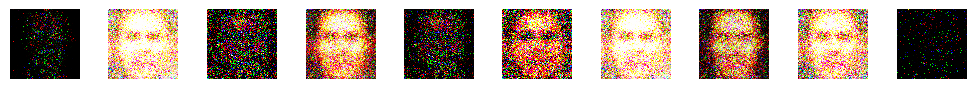

2/2 [==============================] - 0s 22ms/step
Epoch 540/1000, D Loss: 2.481955319599365, G Loss: 4.0762939453125
2/2 [==============================] - 0s 22ms/step
Epoch 541/1000, D Loss: 1.6816268563270569, G Loss: 4.4677276611328125
2/2 [==============================] - 0s 22ms/step
Epoch 542/1000, D Loss: 0.7919754087924957, G Loss: 7.954881191253662
2/2 [==============================] - 0s 23ms/step
Epoch 543/1000, D Loss: 0.7015288472175598, G Loss: 3.497694969177246
2/2 [==============================] - 0s 22ms/step
Epoch 544/1000, D Loss: 0.12498974427580833, G Loss: 3.383650541305542
2/2 [==============================] - 0s 22ms/step
Epoch 545/1000, D Loss: 0.13624988496303558, G Loss: 5.257028579711914
2/2 [==============================] - 0s 23ms/step
Epoch 546/1000, D Loss: 2.1714490124577424, G Loss: 5.367400646209717
2/2 [==============================] - 0s 22ms/step
Epoch 547/1000, D Loss: 3.235926628112793, G Loss: 2.3075342178344727
2/2 [===================

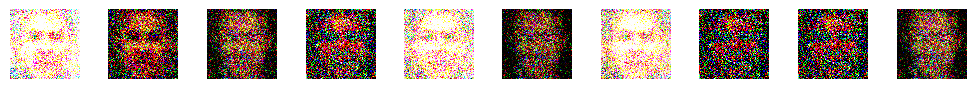

2/2 [==============================] - 0s 22ms/step
Epoch 550/1000, D Loss: 0.21059120446443558, G Loss: 3.257366418838501
2/2 [==============================] - 0s 22ms/step
Epoch 551/1000, D Loss: 0.2224796935915947, G Loss: 2.835015058517456
2/2 [==============================] - 0s 22ms/step
Epoch 552/1000, D Loss: 0.25294505804777145, G Loss: 4.0841569900512695
2/2 [==============================] - 0s 22ms/step
Epoch 553/1000, D Loss: 0.1661171019077301, G Loss: 3.397662878036499
2/2 [==============================] - 0s 22ms/step
Epoch 554/1000, D Loss: 0.17561477422714233, G Loss: 3.587404489517212
2/2 [==============================] - 0s 22ms/step
Epoch 555/1000, D Loss: 3.773253917694092, G Loss: 0.6111409664154053
2/2 [==============================] - 0s 22ms/step
Epoch 556/1000, D Loss: 0.6157440096139908, G Loss: 4.953473091125488
2/2 [==============================] - 0s 22ms/step
Epoch 557/1000, D Loss: 0.10607477650046349, G Loss: 3.760129451751709
2/2 [==============

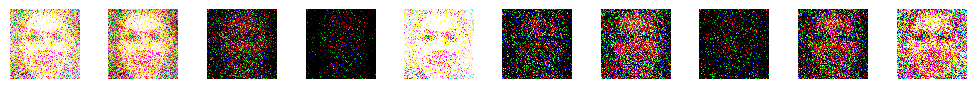

2/2 [==============================] - 0s 22ms/step
Epoch 560/1000, D Loss: 0.07588738948106766, G Loss: 2.9851150512695312
2/2 [==============================] - 0s 26ms/step
Epoch 561/1000, D Loss: 0.4662686139345169, G Loss: 4.740697860717773
2/2 [==============================] - 0s 23ms/step
Epoch 562/1000, D Loss: 0.09832047671079636, G Loss: 4.284955978393555
2/2 [==============================] - 0s 23ms/step
Epoch 563/1000, D Loss: 1.364666918059811, G Loss: 2.131699562072754
2/2 [==============================] - 0s 22ms/step
Epoch 564/1000, D Loss: 0.7813299745321274, G Loss: 1.5389373302459717
2/2 [==============================] - 0s 22ms/step
Epoch 565/1000, D Loss: 0.17868781834840775, G Loss: 3.0629045963287354
2/2 [==============================] - 0s 22ms/step
Epoch 566/1000, D Loss: 0.16709675639867783, G Loss: 2.7604362964630127
2/2 [==============================] - 0s 23ms/step
Epoch 567/1000, D Loss: 0.13668879866600037, G Loss: 3.1742115020751953
2/2 [==========

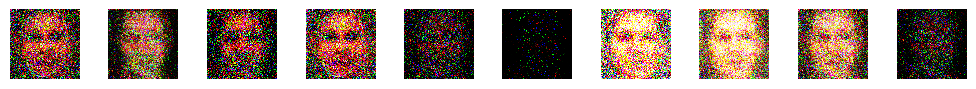

2/2 [==============================] - 0s 22ms/step
Epoch 570/1000, D Loss: 0.10121491178870201, G Loss: 3.438100814819336
2/2 [==============================] - 0s 22ms/step
Epoch 571/1000, D Loss: 0.23321892041713, G Loss: 6.75149393081665
2/2 [==============================] - 0s 22ms/step
Epoch 572/1000, D Loss: 2.5099563002586365, G Loss: 0.9035578370094299
2/2 [==============================] - 0s 22ms/step
Epoch 573/1000, D Loss: 0.1294751837849617, G Loss: 4.31625509262085
2/2 [==============================] - 0s 22ms/step
Epoch 574/1000, D Loss: 0.22514759004116058, G Loss: 3.927051067352295
2/2 [==============================] - 0s 22ms/step
Epoch 575/1000, D Loss: 0.2071797028183937, G Loss: 3.6054985523223877
2/2 [==============================] - 0s 22ms/step
Epoch 576/1000, D Loss: 0.3146760165691376, G Loss: 4.066520690917969
2/2 [==============================] - 0s 22ms/step
Epoch 577/1000, D Loss: 0.6514547914266586, G Loss: 4.483322620391846
2/2 [===================

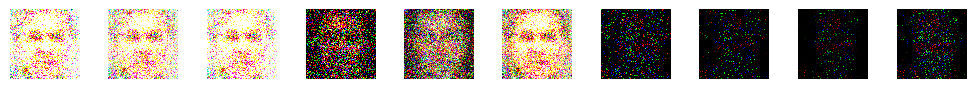

2/2 [==============================] - 0s 23ms/step
Epoch 580/1000, D Loss: 0.08313185721635818, G Loss: 3.7927510738372803
2/2 [==============================] - 0s 22ms/step
Epoch 581/1000, D Loss: 0.29124271869659424, G Loss: 4.979885101318359
2/2 [==============================] - 0s 22ms/step
Epoch 582/1000, D Loss: 0.35736459493637085, G Loss: 6.209654331207275
2/2 [==============================] - 0s 22ms/step
Epoch 583/1000, D Loss: 1.0023780465126038, G Loss: 4.796656131744385
2/2 [==============================] - 0s 22ms/step
Epoch 584/1000, D Loss: 0.10976865887641907, G Loss: 3.8384053707122803
2/2 [==============================] - 0s 23ms/step
Epoch 585/1000, D Loss: 0.5257481783628464, G Loss: 8.641836166381836
2/2 [==============================] - 0s 23ms/step
Epoch 586/1000, D Loss: 1.802398920059204, G Loss: 2.3987505435943604
2/2 [==============================] - 0s 24ms/step
Epoch 587/1000, D Loss: 0.09142564609646797, G Loss: 4.106305122375488
2/2 [============

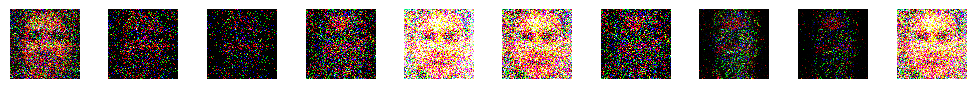

2/2 [==============================] - 0s 22ms/step
Epoch 590/1000, D Loss: 0.3995959535241127, G Loss: 2.5526211261749268
2/2 [==============================] - 0s 22ms/step
Epoch 591/1000, D Loss: 0.14073554426431656, G Loss: 5.521055221557617
2/2 [==============================] - 0s 22ms/step
Epoch 592/1000, D Loss: 0.1095574963837862, G Loss: 4.495553016662598
2/2 [==============================] - 0s 23ms/step
Epoch 593/1000, D Loss: 0.32395459711551666, G Loss: 4.3450236320495605
2/2 [==============================] - 0s 24ms/step
Epoch 594/1000, D Loss: 0.23863936960697174, G Loss: 3.5689501762390137
2/2 [==============================] - 0s 22ms/step
Epoch 595/1000, D Loss: 3.623363435268402, G Loss: 0.23171348869800568
2/2 [==============================] - 0s 23ms/step
Epoch 596/1000, D Loss: 0.5409218817949295, G Loss: 2.765289306640625
2/2 [==============================] - 0s 22ms/step
Epoch 597/1000, D Loss: 0.2000516653060913, G Loss: 2.7132434844970703
2/2 [===========

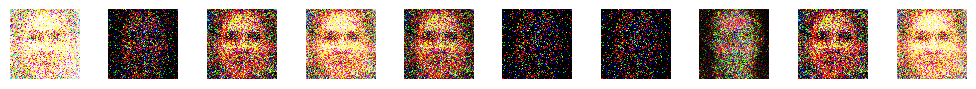

2/2 [==============================] - 0s 23ms/step
Epoch 600/1000, D Loss: 0.12673038244247437, G Loss: 3.46439266204834
2/2 [==============================] - 0s 23ms/step
Epoch 601/1000, D Loss: 0.20867113769054413, G Loss: 7.00290060043335
2/2 [==============================] - 0s 22ms/step
Epoch 602/1000, D Loss: 0.621854230761528, G Loss: 6.669553756713867
2/2 [==============================] - 0s 23ms/step
Epoch 603/1000, D Loss: 0.7102511525154114, G Loss: 2.615704298019409
2/2 [==============================] - 0s 23ms/step
Epoch 604/1000, D Loss: 0.199833732098341, G Loss: 3.1206650733947754
2/2 [==============================] - 0s 22ms/step
Epoch 605/1000, D Loss: 0.13652930781245232, G Loss: 5.0209269523620605
2/2 [==============================] - 0s 23ms/step
Epoch 606/1000, D Loss: 0.23473669588565826, G Loss: 5.061173915863037
2/2 [==============================] - 0s 22ms/step
Epoch 607/1000, D Loss: 0.42565251886844635, G Loss: 4.719892501831055
2/2 [================

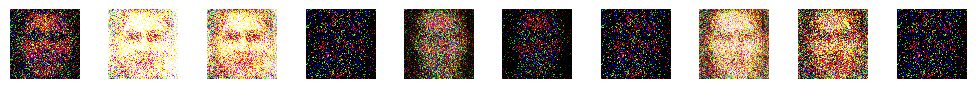

2/2 [==============================] - 0s 22ms/step
Epoch 610/1000, D Loss: 0.6483631134033203, G Loss: 3.5760161876678467
2/2 [==============================] - 0s 22ms/step
Epoch 611/1000, D Loss: 0.22884469479322433, G Loss: 3.038424015045166
2/2 [==============================] - 0s 22ms/step
Epoch 612/1000, D Loss: 0.27459264546632767, G Loss: 2.437967538833618
2/2 [==============================] - 0s 22ms/step
Epoch 613/1000, D Loss: 0.17596355080604553, G Loss: 3.09121036529541
2/2 [==============================] - 0s 23ms/step
Epoch 614/1000, D Loss: 0.37994030117988586, G Loss: 2.899911880493164
2/2 [==============================] - 0s 22ms/step
Epoch 615/1000, D Loss: 0.10602258145809174, G Loss: 3.713954210281372
2/2 [==============================] - 0s 22ms/step
Epoch 616/1000, D Loss: 1.759541630744934, G Loss: 3.378364324569702
2/2 [==============================] - 0s 24ms/step
Epoch 617/1000, D Loss: 0.11782229319214821, G Loss: 5.20682430267334
2/2 [===============

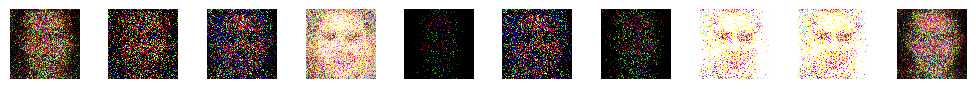

2/2 [==============================] - 0s 23ms/step
Epoch 620/1000, D Loss: 0.20117207616567612, G Loss: 4.465896129608154
2/2 [==============================] - 0s 23ms/step
Epoch 621/1000, D Loss: 0.1410915032029152, G Loss: 3.8550446033477783
2/2 [==============================] - 0s 22ms/step
Epoch 622/1000, D Loss: 0.5204724222421646, G Loss: 5.2036638259887695
2/2 [==============================] - 0s 22ms/step
Epoch 623/1000, D Loss: 0.3381558731198311, G Loss: 7.80755615234375
2/2 [==============================] - 0s 22ms/step
Epoch 624/1000, D Loss: 1.843418538570404, G Loss: 2.322521924972534
2/2 [==============================] - 0s 22ms/step
Epoch 625/1000, D Loss: 0.37876471877098083, G Loss: 2.7368690967559814
2/2 [==============================] - 0s 22ms/step
Epoch 626/1000, D Loss: 0.13379601389169693, G Loss: 3.2843735218048096
2/2 [==============================] - 0s 22ms/step
Epoch 627/1000, D Loss: 0.22940747439861298, G Loss: 4.7637434005737305
2/2 [============

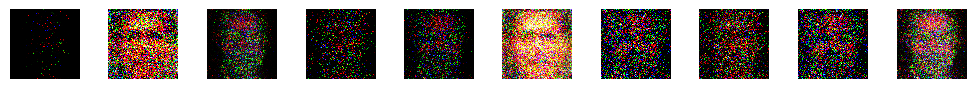

2/2 [==============================] - 0s 23ms/step
Epoch 630/1000, D Loss: 0.35579368472099304, G Loss: 3.3023736476898193
2/2 [==============================] - 0s 24ms/step
Epoch 631/1000, D Loss: 0.1909177303314209, G Loss: 4.295569896697998
2/2 [==============================] - 0s 22ms/step
Epoch 632/1000, D Loss: 0.7803599536418915, G Loss: 6.142031192779541
2/2 [==============================] - 0s 23ms/step
Epoch 633/1000, D Loss: 0.16221381351351738, G Loss: 5.1826887130737305
2/2 [==============================] - 0s 22ms/step
Epoch 634/1000, D Loss: 0.716232106089592, G Loss: 7.469325542449951
2/2 [==============================] - 0s 23ms/step
Epoch 635/1000, D Loss: 0.43921375274658203, G Loss: 5.231375694274902
2/2 [==============================] - 0s 23ms/step
Epoch 636/1000, D Loss: 0.13016220182180405, G Loss: 3.9783480167388916
2/2 [==============================] - 0s 23ms/step
Epoch 637/1000, D Loss: 0.5949034867808223, G Loss: 5.82747745513916
2/2 [==============

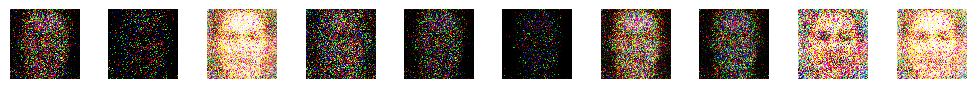

2/2 [==============================] - 0s 22ms/step
Epoch 640/1000, D Loss: 0.17592382431030273, G Loss: 3.6350507736206055
2/2 [==============================] - 0s 23ms/step
Epoch 641/1000, D Loss: 0.6675262451171875, G Loss: 9.897071838378906
2/2 [==============================] - 0s 24ms/step
Epoch 642/1000, D Loss: 0.3845324367284775, G Loss: 3.2545251846313477
2/2 [==============================] - 0s 22ms/step
Epoch 643/1000, D Loss: 0.10021043196320534, G Loss: 4.9353742599487305
2/2 [==============================] - 0s 22ms/step
Epoch 644/1000, D Loss: 0.27969739586114883, G Loss: 4.1780266761779785
2/2 [==============================] - 0s 22ms/step
Epoch 645/1000, D Loss: 0.33986353874206543, G Loss: 5.000656604766846
2/2 [==============================] - 0s 23ms/step
Epoch 646/1000, D Loss: 4.814887523651123, G Loss: 0.20168958604335785
2/2 [==============================] - 0s 23ms/step
Epoch 647/1000, D Loss: 0.365518718957901, G Loss: 3.7384674549102783
2/2 [==========

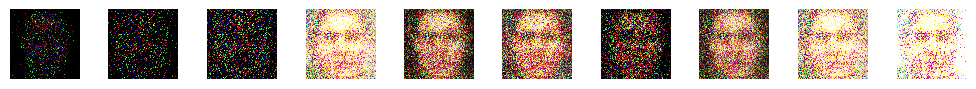

2/2 [==============================] - 0s 23ms/step
Epoch 650/1000, D Loss: 0.2523631155490875, G Loss: 3.3863143920898438
2/2 [==============================] - 0s 23ms/step
Epoch 651/1000, D Loss: 0.13822782412171364, G Loss: 3.2144546508789062
2/2 [==============================] - 0s 22ms/step
Epoch 652/1000, D Loss: 0.3063393533229828, G Loss: 2.8832452297210693
2/2 [==============================] - 0s 22ms/step
Epoch 653/1000, D Loss: 0.16243623197078705, G Loss: 3.589686870574951
2/2 [==============================] - 0s 22ms/step
Epoch 654/1000, D Loss: 2.6109933257102966, G Loss: 1.1235432624816895
2/2 [==============================] - 0s 22ms/step
Epoch 655/1000, D Loss: 0.12287753820419312, G Loss: 4.273106575012207
2/2 [==============================] - 0s 23ms/step
Epoch 656/1000, D Loss: 0.25680308043956757, G Loss: 2.7301671504974365
2/2 [==============================] - 0s 23ms/step
Epoch 657/1000, D Loss: 0.15619652718305588, G Loss: 3.944530725479126
2/2 [=========

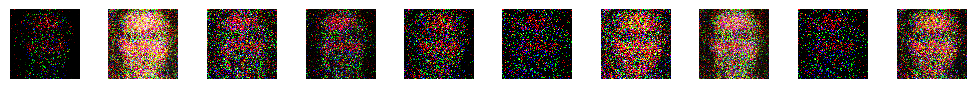

2/2 [==============================] - 0s 22ms/step
Epoch 660/1000, D Loss: 1.1867176592350006, G Loss: 6.415158271789551
2/2 [==============================] - 0s 22ms/step
Epoch 661/1000, D Loss: 0.4970155656337738, G Loss: 5.073702335357666
2/2 [==============================] - 0s 22ms/step
Epoch 662/1000, D Loss: 0.1292017437517643, G Loss: 5.428386211395264
2/2 [==============================] - 0s 22ms/step
Epoch 663/1000, D Loss: 0.3039494603872299, G Loss: 5.839966297149658
2/2 [==============================] - 0s 22ms/step
Epoch 664/1000, D Loss: 2.9851462841033936, G Loss: 1.8904765844345093
2/2 [==============================] - 0s 23ms/step
Epoch 665/1000, D Loss: 3.070862054824829, G Loss: 0.8792697787284851
2/2 [==============================] - 0s 23ms/step
Epoch 666/1000, D Loss: 0.3992018848657608, G Loss: 2.7354235649108887
2/2 [==============================] - 0s 22ms/step
Epoch 667/1000, D Loss: 1.3182314038276672, G Loss: 1.3727810382843018
2/2 [================

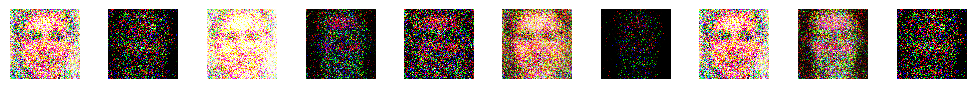

2/2 [==============================] - 0s 22ms/step
Epoch 670/1000, D Loss: 0.8802320659160614, G Loss: 2.213101387023926
2/2 [==============================] - 0s 22ms/step
Epoch 671/1000, D Loss: 0.2258809432387352, G Loss: 3.8175570964813232
2/2 [==============================] - 0s 23ms/step
Epoch 672/1000, D Loss: 0.11785965040326118, G Loss: 3.451820135116577
2/2 [==============================] - 0s 22ms/step
Epoch 673/1000, D Loss: 0.1273762509226799, G Loss: 3.6480963230133057
2/2 [==============================] - 0s 22ms/step
Epoch 674/1000, D Loss: 0.10223052650690079, G Loss: 3.950923204421997
2/2 [==============================] - 0s 22ms/step
Epoch 675/1000, D Loss: 0.25064554810523987, G Loss: 3.1720175743103027
2/2 [==============================] - 0s 22ms/step
Epoch 676/1000, D Loss: 0.08628184534609318, G Loss: 4.596093654632568
2/2 [==============================] - 0s 22ms/step
Epoch 677/1000, D Loss: 0.13130713254213333, G Loss: 5.691000938415527
2/2 [===========

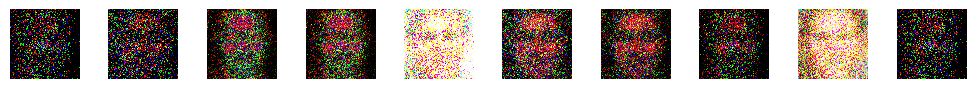

2/2 [==============================] - 0s 23ms/step
Epoch 680/1000, D Loss: 0.44029032066464424, G Loss: 5.0254292488098145
2/2 [==============================] - 0s 22ms/step
Epoch 681/1000, D Loss: 0.46717096865177155, G Loss: 2.6713552474975586
2/2 [==============================] - 0s 22ms/step
Epoch 682/1000, D Loss: 0.18786893039941788, G Loss: 3.403280735015869
2/2 [==============================] - 0s 22ms/step
Epoch 683/1000, D Loss: 0.2183886356651783, G Loss: 3.4736292362213135
2/2 [==============================] - 0s 22ms/step
Epoch 684/1000, D Loss: 0.1643686704337597, G Loss: 4.296387195587158
2/2 [==============================] - 0s 22ms/step
Epoch 685/1000, D Loss: 4.259101152420044, G Loss: 0.514815628528595
2/2 [==============================] - 0s 22ms/step
Epoch 686/1000, D Loss: 0.21893751621246338, G Loss: 3.6961636543273926
2/2 [==============================] - 0s 22ms/step
Epoch 687/1000, D Loss: 0.6856822669506073, G Loss: 4.52973747253418
2/2 [=============

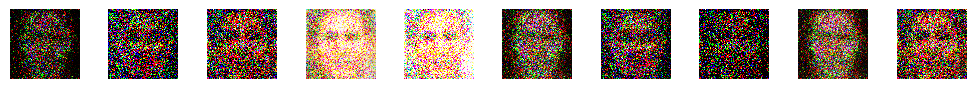

2/2 [==============================] - 0s 22ms/step
Epoch 690/1000, D Loss: 0.15051182359457016, G Loss: 3.7870841026306152
2/2 [==============================] - 0s 22ms/step
Epoch 691/1000, D Loss: 0.6878028512001038, G Loss: 3.442277193069458
2/2 [==============================] - 0s 24ms/step
Epoch 692/1000, D Loss: 0.09213031828403473, G Loss: 4.543004989624023
2/2 [==============================] - 0s 23ms/step
Epoch 693/1000, D Loss: 0.3382485657930374, G Loss: 10.016312599182129
2/2 [==============================] - 0s 22ms/step
Epoch 694/1000, D Loss: 2.0206212401390076, G Loss: 2.2713494300842285
2/2 [==============================] - 0s 23ms/step
Epoch 695/1000, D Loss: 0.22104325890541077, G Loss: 5.166226387023926
2/2 [==============================] - 0s 22ms/step
Epoch 696/1000, D Loss: 0.35651564598083496, G Loss: 5.4133453369140625
2/2 [==============================] - 0s 22ms/step
Epoch 697/1000, D Loss: 0.5031253844499588, G Loss: 11.298640251159668
2/2 [==========

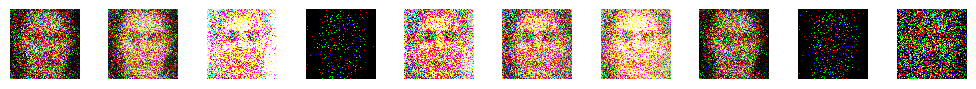

2/2 [==============================] - 0s 23ms/step
Epoch 700/1000, D Loss: 0.42079581320285797, G Loss: 2.861952304840088
2/2 [==============================] - 0s 23ms/step
Epoch 701/1000, D Loss: 0.2063341811299324, G Loss: 3.4561526775360107
2/2 [==============================] - 0s 22ms/step
Epoch 702/1000, D Loss: 0.18404153734445572, G Loss: 4.1863203048706055
2/2 [==============================] - 0s 23ms/step
Epoch 703/1000, D Loss: 0.1580093875527382, G Loss: 3.9028513431549072
2/2 [==============================] - 0s 23ms/step
Epoch 704/1000, D Loss: 0.1265171766281128, G Loss: 4.9287428855896
2/2 [==============================] - 0s 22ms/step
Epoch 705/1000, D Loss: 7.205319166183472, G Loss: 0.20441575348377228
2/2 [==============================] - 0s 22ms/step
Epoch 706/1000, D Loss: 0.5687884241342545, G Loss: 2.413905143737793
2/2 [==============================] - 0s 23ms/step
Epoch 707/1000, D Loss: 0.39173920452594757, G Loss: 2.793853759765625
2/2 [==============

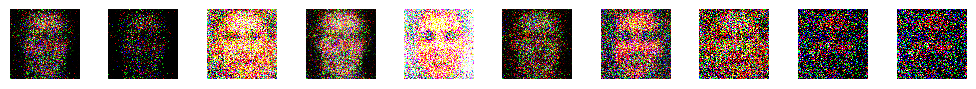

2/2 [==============================] - 0s 23ms/step
Epoch 710/1000, D Loss: 0.1480936650186777, G Loss: 4.099603176116943
2/2 [==============================] - 0s 24ms/step
Epoch 711/1000, D Loss: 0.4129529744386673, G Loss: 4.1692214012146
2/2 [==============================] - 0s 23ms/step
Epoch 712/1000, D Loss: 0.7951648831367493, G Loss: 6.4770426750183105
2/2 [==============================] - 0s 22ms/step
Epoch 713/1000, D Loss: 0.4183352142572403, G Loss: 2.5645618438720703
2/2 [==============================] - 0s 23ms/step
Epoch 714/1000, D Loss: 0.10868498310446739, G Loss: 3.892221450805664
2/2 [==============================] - 0s 22ms/step
Epoch 715/1000, D Loss: 0.15982943773269653, G Loss: 4.759645462036133
2/2 [==============================] - 0s 23ms/step
Epoch 716/1000, D Loss: 0.33397917030379176, G Loss: 6.078985691070557
2/2 [==============================] - 0s 23ms/step
Epoch 717/1000, D Loss: 0.7332435846328735, G Loss: 1.7726378440856934
2/2 [===============

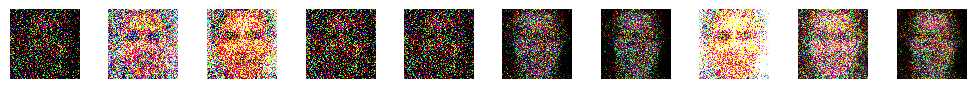

2/2 [==============================] - 0s 22ms/step
Epoch 720/1000, D Loss: 0.38541939854621887, G Loss: 3.221998691558838
2/2 [==============================] - 0s 23ms/step
Epoch 721/1000, D Loss: 0.2812659591436386, G Loss: 6.730401039123535
2/2 [==============================] - 0s 23ms/step
Epoch 722/1000, D Loss: 0.45618151128292084, G Loss: 9.3932466506958
2/2 [==============================] - 0s 23ms/step
Epoch 723/1000, D Loss: 3.4091981649398804, G Loss: 1.5462547540664673
2/2 [==============================] - 0s 26ms/step
Epoch 724/1000, D Loss: 0.22033873200416565, G Loss: 3.171295166015625
2/2 [==============================] - 0s 22ms/step
Epoch 725/1000, D Loss: 0.14465636759996414, G Loss: 3.91518497467041
2/2 [==============================] - 0s 24ms/step
Epoch 726/1000, D Loss: 0.34317008405923843, G Loss: 3.913463830947876
2/2 [==============================] - 0s 24ms/step
Epoch 727/1000, D Loss: 1.5597333908081055, G Loss: 3.8350491523742676
2/2 [===============

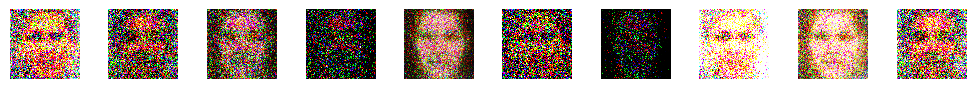

2/2 [==============================] - 0s 22ms/step
Epoch 730/1000, D Loss: 0.5235667824745178, G Loss: 2.9759838581085205
2/2 [==============================] - 0s 22ms/step
Epoch 731/1000, D Loss: 0.4515232890844345, G Loss: 3.712282180786133
2/2 [==============================] - 0s 22ms/step
Epoch 732/1000, D Loss: 0.4106300622224808, G Loss: 9.179764747619629
2/2 [==============================] - 0s 22ms/step
Epoch 733/1000, D Loss: 0.37589165568351746, G Loss: 6.701635360717773
2/2 [==============================] - 0s 22ms/step
Epoch 734/1000, D Loss: 0.3295166343450546, G Loss: 8.550827980041504
2/2 [==============================] - 0s 22ms/step
Epoch 735/1000, D Loss: 0.4884141981601715, G Loss: 6.65060567855835
2/2 [==============================] - 0s 22ms/step
Epoch 736/1000, D Loss: 0.26184017211198807, G Loss: 5.877099514007568
2/2 [==============================] - 0s 22ms/step
Epoch 737/1000, D Loss: 2.6659677624702454, G Loss: 1.9878687858581543
2/2 [================

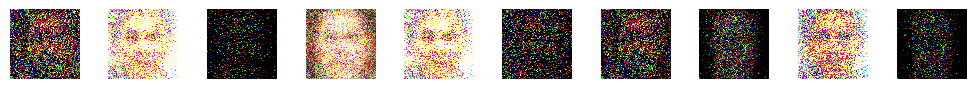

2/2 [==============================] - 0s 22ms/step
Epoch 740/1000, D Loss: 0.32548944652080536, G Loss: 4.041009902954102
2/2 [==============================] - 0s 22ms/step
Epoch 741/1000, D Loss: 0.09474827721714973, G Loss: 4.404843330383301
2/2 [==============================] - 0s 23ms/step
Epoch 742/1000, D Loss: 2.6773443520069122, G Loss: 2.156359910964966
2/2 [==============================] - 0s 22ms/step
Epoch 743/1000, D Loss: 0.06457466632127762, G Loss: 6.372399806976318
2/2 [==============================] - 0s 23ms/step
Epoch 744/1000, D Loss: 0.21862461417913437, G Loss: 6.335056781768799
2/2 [==============================] - 0s 23ms/step
Epoch 745/1000, D Loss: 0.18717984855175018, G Loss: 3.7224819660186768
2/2 [==============================] - 0s 22ms/step
Epoch 746/1000, D Loss: 0.27581900358200073, G Loss: 3.0523571968078613
2/2 [==============================] - 0s 22ms/step
Epoch 747/1000, D Loss: 0.26166462153196335, G Loss: 3.266964912414551
2/2 [==========

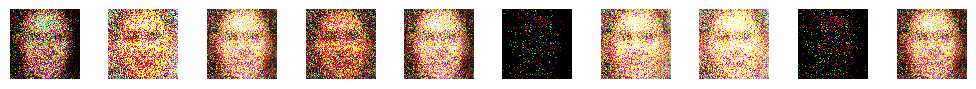

2/2 [==============================] - 0s 22ms/step
Epoch 750/1000, D Loss: 5.5000176429748535, G Loss: 1.2044295072555542
2/2 [==============================] - 0s 22ms/step
Epoch 751/1000, D Loss: 0.12950749322772026, G Loss: 4.711200714111328
2/2 [==============================] - 0s 22ms/step
Epoch 752/1000, D Loss: 1.3254021406173706, G Loss: 2.3260438442230225
2/2 [==============================] - 0s 22ms/step
Epoch 753/1000, D Loss: 0.1112787276506424, G Loss: 4.429147720336914
2/2 [==============================] - 0s 22ms/step
Epoch 754/1000, D Loss: 0.24552910029888153, G Loss: 3.709282636642456
2/2 [==============================] - 0s 23ms/step
Epoch 755/1000, D Loss: 0.5556685030460358, G Loss: 3.771674871444702
2/2 [==============================] - 0s 22ms/step
Epoch 756/1000, D Loss: 2.293824315071106, G Loss: 2.729666233062744
2/2 [==============================] - 0s 22ms/step
Epoch 757/1000, D Loss: 0.0912493746727705, G Loss: 6.187308311462402
2/2 [================

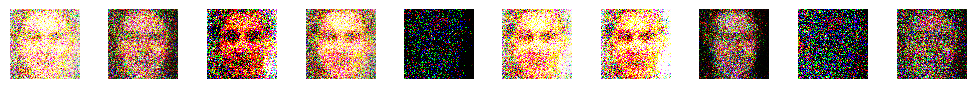

2/2 [==============================] - 0s 22ms/step
Epoch 760/1000, D Loss: 1.0531362295150757, G Loss: 3.465064287185669
2/2 [==============================] - 0s 22ms/step
Epoch 761/1000, D Loss: 1.593491554260254, G Loss: 4.627295970916748
2/2 [==============================] - 0s 23ms/step
Epoch 762/1000, D Loss: 0.35798996686935425, G Loss: 6.404470920562744
2/2 [==============================] - 0s 22ms/step
Epoch 763/1000, D Loss: 0.9773389101028442, G Loss: 8.932103157043457
2/2 [==============================] - 0s 23ms/step
Epoch 764/1000, D Loss: 4.987543702125549, G Loss: 3.070103645324707
2/2 [==============================] - 0s 23ms/step
Epoch 765/1000, D Loss: 0.31242693960666656, G Loss: 3.452446937561035
2/2 [==============================] - 0s 23ms/step
Epoch 766/1000, D Loss: 0.26814956218004227, G Loss: 5.070397853851318
2/2 [==============================] - 0s 22ms/step
Epoch 767/1000, D Loss: 1.512493908405304, G Loss: 2.733107566833496
2/2 [===================

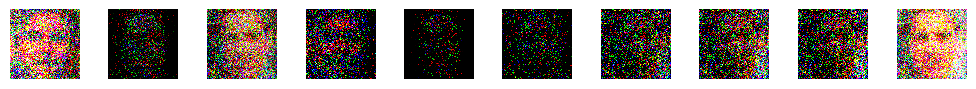

2/2 [==============================] - 0s 22ms/step
Epoch 770/1000, D Loss: 0.22940272092819214, G Loss: 3.337418556213379
2/2 [==============================] - 0s 22ms/step
Epoch 771/1000, D Loss: 0.2760518044233322, G Loss: 3.3824028968811035
2/2 [==============================] - 0s 24ms/step
Epoch 772/1000, D Loss: 0.2923869639635086, G Loss: 6.6243720054626465
2/2 [==============================] - 0s 22ms/step
Epoch 773/1000, D Loss: 0.23317671194672585, G Loss: 7.000042915344238
2/2 [==============================] - 0s 22ms/step
Epoch 774/1000, D Loss: 0.3046626001596451, G Loss: 4.864712715148926
2/2 [==============================] - 0s 23ms/step
Epoch 775/1000, D Loss: 0.13162584602832794, G Loss: 7.224753379821777
2/2 [==============================] - 0s 23ms/step
Epoch 776/1000, D Loss: 0.3799929618835449, G Loss: 4.8034257888793945
2/2 [==============================] - 0s 22ms/step
Epoch 777/1000, D Loss: 2.6559808254241943, G Loss: 0.6824702620506287
2/2 [============

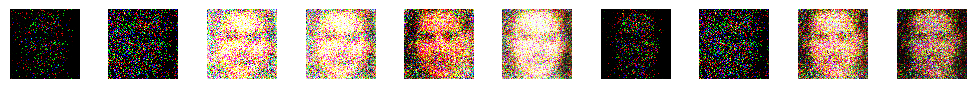

2/2 [==============================] - 0s 25ms/step
Epoch 780/1000, D Loss: 0.23305048048496246, G Loss: 7.002857685089111
2/2 [==============================] - 0s 23ms/step
Epoch 781/1000, D Loss: 1.6931912899017334, G Loss: 9.18569564819336
2/2 [==============================] - 0s 23ms/step
Epoch 782/1000, D Loss: 4.138573884963989, G Loss: 1.5330973863601685
2/2 [==============================] - 0s 22ms/step
Epoch 783/1000, D Loss: 0.6885691583156586, G Loss: 2.94123911857605
2/2 [==============================] - 0s 23ms/step
Epoch 784/1000, D Loss: 1.1139589846134186, G Loss: 3.3725430965423584
2/2 [==============================] - 0s 23ms/step
Epoch 785/1000, D Loss: 1.0894323587417603, G Loss: 2.7207884788513184
2/2 [==============================] - 0s 22ms/step
Epoch 786/1000, D Loss: 0.2447430044412613, G Loss: 3.1415610313415527
2/2 [==============================] - 0s 22ms/step
Epoch 787/1000, D Loss: 0.1443435437977314, G Loss: 3.13242244720459
2/2 [==================

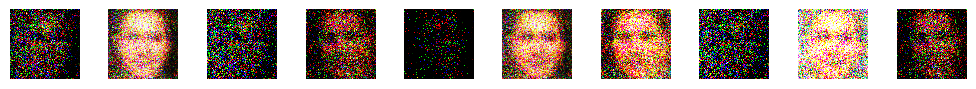

2/2 [==============================] - 0s 22ms/step
Epoch 790/1000, D Loss: 1.7614750862121582, G Loss: 3.6523032188415527
2/2 [==============================] - 0s 22ms/step
Epoch 791/1000, D Loss: 0.10789679363369942, G Loss: 4.619706630706787
2/2 [==============================] - 0s 22ms/step
Epoch 792/1000, D Loss: 0.17848454415798187, G Loss: 4.762594699859619
2/2 [==============================] - 0s 22ms/step
Epoch 793/1000, D Loss: 0.13588305562734604, G Loss: 4.261475086212158
2/2 [==============================] - 0s 22ms/step
Epoch 794/1000, D Loss: 0.5932939648628235, G Loss: 3.784487247467041
2/2 [==============================] - 0s 22ms/step
Epoch 795/1000, D Loss: 0.6642414629459381, G Loss: 7.512599945068359
2/2 [==============================] - 0s 23ms/step
Epoch 796/1000, D Loss: 1.6604067087173462, G Loss: 2.9441945552825928
2/2 [==============================] - 0s 22ms/step
Epoch 797/1000, D Loss: 0.24583988636732101, G Loss: 3.38777232170105
2/2 [==============

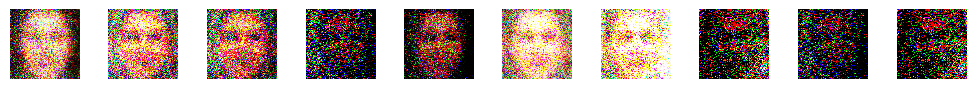

2/2 [==============================] - 0s 23ms/step
Epoch 800/1000, D Loss: 0.6021589487791061, G Loss: 5.028510570526123
2/2 [==============================] - 0s 22ms/step
Epoch 801/1000, D Loss: 0.45044660568237305, G Loss: 4.649458885192871
2/2 [==============================] - 0s 22ms/step
Epoch 802/1000, D Loss: 4.673653841018677, G Loss: 0.49784451723098755
2/2 [==============================] - 0s 23ms/step
Epoch 803/1000, D Loss: 0.6943054804578424, G Loss: 6.203585624694824
2/2 [==============================] - 0s 25ms/step
Epoch 804/1000, D Loss: 1.4243195056915283, G Loss: 1.7025632858276367
2/2 [==============================] - 0s 24ms/step
Epoch 805/1000, D Loss: 0.4654303789138794, G Loss: 3.3091225624084473
2/2 [==============================] - 0s 22ms/step
Epoch 806/1000, D Loss: 1.667996346950531, G Loss: 1.2507424354553223
2/2 [==============================] - 0s 22ms/step
Epoch 807/1000, D Loss: 0.22487501055002213, G Loss: 3.251366376876831
2/2 [==============

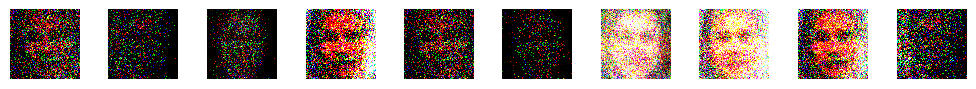

2/2 [==============================] - 0s 22ms/step
Epoch 810/1000, D Loss: 0.1563892588019371, G Loss: 3.3728280067443848
2/2 [==============================] - 0s 23ms/step
Epoch 811/1000, D Loss: 0.2269429937005043, G Loss: 4.058474063873291
2/2 [==============================] - 0s 22ms/step
Epoch 812/1000, D Loss: 0.18454743921756744, G Loss: 4.797545909881592
2/2 [==============================] - 0s 22ms/step
Epoch 813/1000, D Loss: 1.7198136746883392, G Loss: 2.5600719451904297
2/2 [==============================] - 0s 22ms/step
Epoch 814/1000, D Loss: 0.0963321104645729, G Loss: 4.007490158081055
2/2 [==============================] - 0s 23ms/step
Epoch 815/1000, D Loss: 0.37777402997016907, G Loss: 4.443185329437256
2/2 [==============================] - 0s 22ms/step
Epoch 816/1000, D Loss: 0.14856791496276855, G Loss: 4.0892720222473145
2/2 [==============================] - 0s 22ms/step
Epoch 817/1000, D Loss: 0.46061737835407257, G Loss: 3.568563222885132
2/2 [============

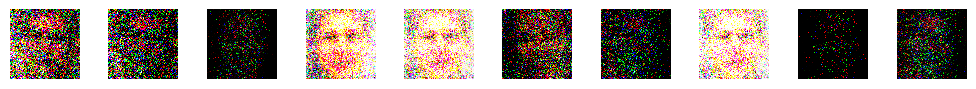

2/2 [==============================] - 0s 22ms/step
Epoch 820/1000, D Loss: 6.014972597360611, G Loss: 2.890507698059082
2/2 [==============================] - 0s 22ms/step
Epoch 821/1000, D Loss: 0.36197409871965647, G Loss: 5.315819263458252
2/2 [==============================] - 0s 22ms/step
Epoch 822/1000, D Loss: 0.9435006678104401, G Loss: 4.196263790130615
2/2 [==============================] - 0s 22ms/step
Epoch 823/1000, D Loss: 1.202158659696579, G Loss: 2.085622549057007
2/2 [==============================] - 0s 22ms/step
Epoch 824/1000, D Loss: 0.6345136165618896, G Loss: 4.094426155090332
2/2 [==============================] - 0s 23ms/step
Epoch 825/1000, D Loss: 1.2956793308258057, G Loss: 2.6487550735473633
2/2 [==============================] - 0s 22ms/step
Epoch 826/1000, D Loss: 0.8346201479434967, G Loss: 3.28509521484375
2/2 [==============================] - 0s 22ms/step
Epoch 827/1000, D Loss: 0.1577211171388626, G Loss: 4.3977508544921875
2/2 [===================

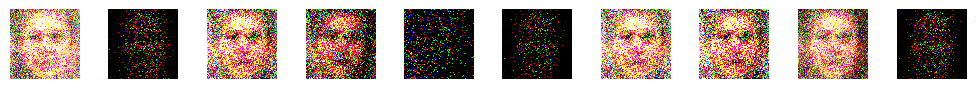

2/2 [==============================] - 0s 22ms/step
Epoch 830/1000, D Loss: 0.14823897555470467, G Loss: 3.1467528343200684
2/2 [==============================] - 0s 22ms/step
Epoch 831/1000, D Loss: 0.16125129163265228, G Loss: 4.447908401489258
2/2 [==============================] - 0s 23ms/step
Epoch 832/1000, D Loss: 0.15532581508159637, G Loss: 5.878332614898682
2/2 [==============================] - 0s 22ms/step
Epoch 833/1000, D Loss: 0.13898729905486107, G Loss: 4.393604278564453
2/2 [==============================] - 0s 23ms/step
Epoch 834/1000, D Loss: 4.672878861427307, G Loss: 2.577256679534912
2/2 [==============================] - 0s 22ms/step
Epoch 835/1000, D Loss: 0.3667699992656708, G Loss: 3.5673508644104004
2/2 [==============================] - 0s 22ms/step
Epoch 836/1000, D Loss: 0.7264836728572845, G Loss: 2.738605260848999
2/2 [==============================] - 0s 22ms/step
Epoch 837/1000, D Loss: 1.0814789235591888, G Loss: 2.5757956504821777
2/2 [=============

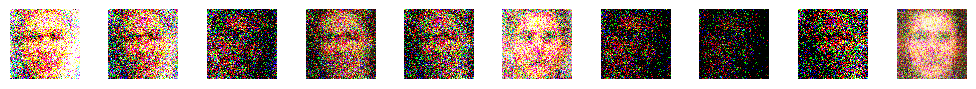

2/2 [==============================] - 0s 23ms/step
Epoch 840/1000, D Loss: 0.1844991222023964, G Loss: 5.4650726318359375
2/2 [==============================] - 0s 22ms/step
Epoch 841/1000, D Loss: 0.7163534462451935, G Loss: 3.922058343887329
2/2 [==============================] - 0s 22ms/step
Epoch 842/1000, D Loss: 0.2855743169784546, G Loss: 3.1984360218048096
2/2 [==============================] - 0s 23ms/step
Epoch 843/1000, D Loss: 0.22092624753713608, G Loss: 4.047980785369873
2/2 [==============================] - 0s 22ms/step
Epoch 844/1000, D Loss: 0.41874121129512787, G Loss: 8.082013130187988
2/2 [==============================] - 0s 23ms/step
Epoch 845/1000, D Loss: 1.4759268164634705, G Loss: 1.691524863243103
2/2 [==============================] - 0s 24ms/step
Epoch 846/1000, D Loss: 0.29650962352752686, G Loss: 3.5116937160491943
2/2 [==============================] - 0s 22ms/step
Epoch 847/1000, D Loss: 0.22047369182109833, G Loss: 3.929804801940918
2/2 [============

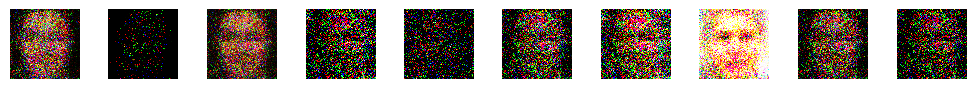

2/2 [==============================] - 0s 22ms/step
Epoch 850/1000, D Loss: 0.7934250086545944, G Loss: 3.888991355895996
2/2 [==============================] - 0s 23ms/step
Epoch 851/1000, D Loss: 0.5453865230083466, G Loss: 3.603503465652466
2/2 [==============================] - 0s 23ms/step
Epoch 852/1000, D Loss: 0.37268301844596863, G Loss: 3.397489547729492
2/2 [==============================] - 0s 22ms/step
Epoch 853/1000, D Loss: 0.44182010740041733, G Loss: 5.629436016082764
2/2 [==============================] - 0s 22ms/step
Epoch 854/1000, D Loss: 0.2711637504398823, G Loss: 3.228414297103882
2/2 [==============================] - 0s 22ms/step
Epoch 855/1000, D Loss: 0.172927625477314, G Loss: 4.807873725891113
2/2 [==============================] - 0s 23ms/step
Epoch 856/1000, D Loss: 0.34773994982242584, G Loss: 10.996831893920898
2/2 [==============================] - 0s 22ms/step
Epoch 857/1000, D Loss: 2.8996042013168335, G Loss: 2.224731206893921
2/2 [================

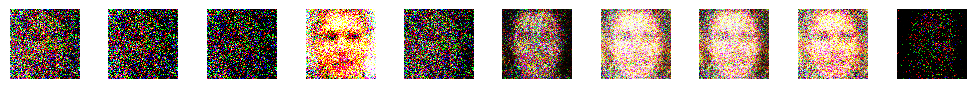

2/2 [==============================] - 0s 23ms/step
Epoch 860/1000, D Loss: 0.2598240226507187, G Loss: 3.466639518737793
2/2 [==============================] - 0s 24ms/step
Epoch 861/1000, D Loss: 0.3714917302131653, G Loss: 8.780895233154297
2/2 [==============================] - 0s 22ms/step
Epoch 862/1000, D Loss: 1.8929097652435303, G Loss: 1.6052321195602417
2/2 [==============================] - 0s 23ms/step
Epoch 863/1000, D Loss: 0.15873544290661812, G Loss: 3.7038652896881104
2/2 [==============================] - 0s 22ms/step
Epoch 864/1000, D Loss: 0.7701674103736877, G Loss: 4.888776779174805
2/2 [==============================] - 0s 22ms/step
Epoch 865/1000, D Loss: 0.4242161810398102, G Loss: 4.289612293243408
2/2 [==============================] - 0s 22ms/step
Epoch 866/1000, D Loss: 0.43218037486076355, G Loss: 6.154427528381348
2/2 [==============================] - 0s 22ms/step
Epoch 867/1000, D Loss: 0.12274431250989437, G Loss: 8.102190971374512
2/2 [==============

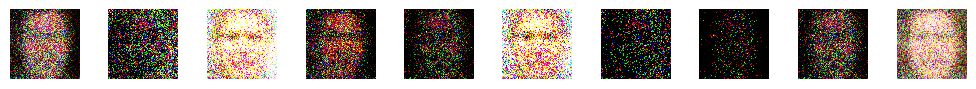

2/2 [==============================] - 0s 23ms/step
Epoch 870/1000, D Loss: 1.3808322548866272, G Loss: 3.054987907409668
2/2 [==============================] - 0s 23ms/step
Epoch 871/1000, D Loss: 1.0968476235866547, G Loss: 3.5161874294281006
2/2 [==============================] - 0s 22ms/step
Epoch 872/1000, D Loss: 1.394016146659851, G Loss: 2.1795613765716553
2/2 [==============================] - 0s 23ms/step
Epoch 873/1000, D Loss: 0.4539467692375183, G Loss: 3.8542120456695557
2/2 [==============================] - 0s 23ms/step
Epoch 874/1000, D Loss: 0.380935475230217, G Loss: 4.781497955322266
2/2 [==============================] - 0s 23ms/step
Epoch 875/1000, D Loss: 0.5147153288125992, G Loss: 3.8303606510162354
2/2 [==============================] - 0s 22ms/step
Epoch 876/1000, D Loss: 0.22181004285812378, G Loss: 5.434508800506592
2/2 [==============================] - 0s 22ms/step
Epoch 877/1000, D Loss: 0.20290567725896835, G Loss: 4.930544853210449
2/2 [===============

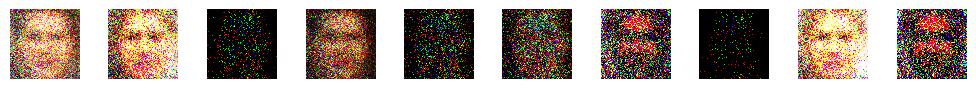

2/2 [==============================] - 0s 22ms/step
Epoch 880/1000, D Loss: 0.2544611170887947, G Loss: 4.832047939300537
2/2 [==============================] - 0s 22ms/step
Epoch 881/1000, D Loss: 0.1742121074348688, G Loss: 5.303713798522949
2/2 [==============================] - 0s 23ms/step
Epoch 882/1000, D Loss: 0.4835141748189926, G Loss: 3.8361082077026367
2/2 [==============================] - 0s 24ms/step
Epoch 883/1000, D Loss: 0.6492684185504913, G Loss: 4.070257186889648
2/2 [==============================] - 0s 22ms/step
Epoch 884/1000, D Loss: 1.6938764452934265, G Loss: 1.3140205144882202
2/2 [==============================] - 0s 23ms/step
Epoch 885/1000, D Loss: 0.3684559613466263, G Loss: 3.404536247253418
2/2 [==============================] - 0s 22ms/step
Epoch 886/1000, D Loss: 0.5335491895675659, G Loss: 3.7596933841705322
2/2 [==============================] - 0s 22ms/step
Epoch 887/1000, D Loss: 0.6905606091022491, G Loss: 5.877844333648682
2/2 [================

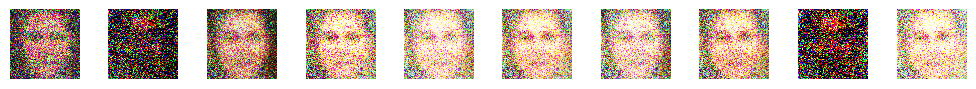

2/2 [==============================] - 0s 22ms/step
Epoch 890/1000, D Loss: 0.6543103754520416, G Loss: 3.3034920692443848
2/2 [==============================] - 0s 23ms/step
Epoch 891/1000, D Loss: 0.21807673573493958, G Loss: 5.192129135131836
2/2 [==============================] - 0s 23ms/step
Epoch 892/1000, D Loss: 2.6317712664604187, G Loss: 0.5423041582107544
2/2 [==============================] - 0s 23ms/step
Epoch 893/1000, D Loss: 0.9711011648178101, G Loss: 1.9912627935409546
2/2 [==============================] - 0s 23ms/step
Epoch 894/1000, D Loss: 0.5159093886613846, G Loss: 3.3661234378814697
2/2 [==============================] - 0s 23ms/step
Epoch 895/1000, D Loss: 0.6161413490772247, G Loss: 4.28620719909668
2/2 [==============================] - 0s 22ms/step
Epoch 896/1000, D Loss: 0.7071861922740936, G Loss: 3.92333984375
2/2 [==============================] - 0s 22ms/step
Epoch 897/1000, D Loss: 0.13356201723217964, G Loss: 6.470640659332275
2/2 [==================

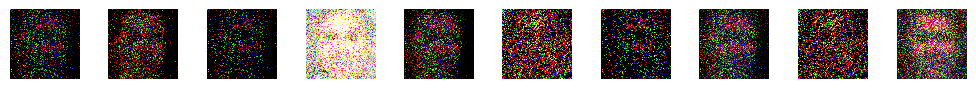

2/2 [==============================] - 0s 22ms/step
Epoch 900/1000, D Loss: 0.2868565618991852, G Loss: 10.362688064575195
2/2 [==============================] - 0s 22ms/step
Epoch 901/1000, D Loss: 1.1808043122291565, G Loss: 3.210366725921631
2/2 [==============================] - 0s 22ms/step
Epoch 902/1000, D Loss: 0.24994860589504242, G Loss: 5.505223274230957
2/2 [==============================] - 0s 22ms/step
Epoch 903/1000, D Loss: 0.2607294023036957, G Loss: 6.206852912902832
2/2 [==============================] - 0s 22ms/step
Epoch 904/1000, D Loss: 3.0269250869750977, G Loss: 1.0913496017456055
2/2 [==============================] - 0s 23ms/step
Epoch 905/1000, D Loss: 5.9292662143707275, G Loss: 2.893782615661621
2/2 [==============================] - 0s 24ms/step
Epoch 906/1000, D Loss: 3.9163491129875183, G Loss: 1.9029874801635742
2/2 [==============================] - 0s 22ms/step
Epoch 907/1000, D Loss: 0.5208832770586014, G Loss: 3.3912248611450195
2/2 [==============

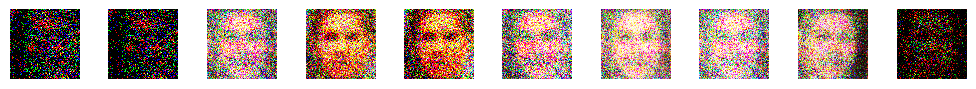

2/2 [==============================] - 0s 25ms/step
Epoch 910/1000, D Loss: 0.15894191712141037, G Loss: 4.326711177825928
2/2 [==============================] - 0s 22ms/step
Epoch 911/1000, D Loss: 2.538416862487793, G Loss: 3.7100331783294678
2/2 [==============================] - 0s 22ms/step
Epoch 912/1000, D Loss: 0.39841028209775686, G Loss: 9.491788864135742
2/2 [==============================] - 0s 22ms/step
Epoch 913/1000, D Loss: 0.5381513237953186, G Loss: 4.605888843536377
2/2 [==============================] - 0s 22ms/step
Epoch 914/1000, D Loss: 0.8236428499221802, G Loss: 5.261171817779541
2/2 [==============================] - 0s 22ms/step
Epoch 915/1000, D Loss: 0.38160568475723267, G Loss: 5.801694393157959
2/2 [==============================] - 0s 22ms/step
Epoch 916/1000, D Loss: 1.5011048913002014, G Loss: 3.650143623352051
2/2 [==============================] - 0s 22ms/step
Epoch 917/1000, D Loss: 0.6342633664608002, G Loss: 4.308004856109619
2/2 [================

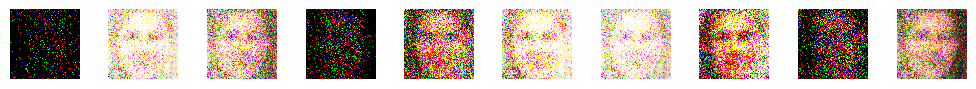

2/2 [==============================] - 0s 22ms/step
Epoch 920/1000, D Loss: 0.9048267900943756, G Loss: 2.6747357845306396
2/2 [==============================] - 0s 22ms/step
Epoch 921/1000, D Loss: 0.31861667335033417, G Loss: 4.115945339202881
2/2 [==============================] - 0s 22ms/step
Epoch 922/1000, D Loss: 0.23512425273656845, G Loss: 4.556070804595947
2/2 [==============================] - 0s 22ms/step
Epoch 923/1000, D Loss: 1.1314402222633362, G Loss: 4.550805568695068
2/2 [==============================] - 0s 22ms/step
Epoch 924/1000, D Loss: 0.45079633593559265, G Loss: 6.542646884918213
2/2 [==============================] - 0s 22ms/step
Epoch 925/1000, D Loss: 1.9612706303596497, G Loss: 1.2894514799118042
2/2 [==============================] - 0s 23ms/step
Epoch 926/1000, D Loss: 0.40135714411735535, G Loss: 4.433643341064453
2/2 [==============================] - 0s 22ms/step
Epoch 927/1000, D Loss: 0.3656073063611984, G Loss: 4.606810092926025
2/2 [=============

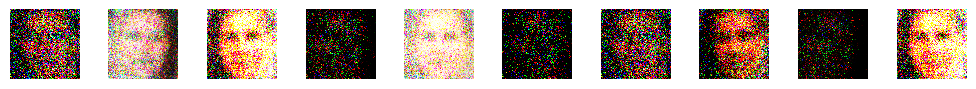

2/2 [==============================] - 0s 23ms/step
Epoch 930/1000, D Loss: 0.3616308271884918, G Loss: 4.5462117195129395
2/2 [==============================] - 0s 22ms/step
Epoch 931/1000, D Loss: 0.6770689487457275, G Loss: 44.35997009277344
2/2 [==============================] - 0s 22ms/step
Epoch 932/1000, D Loss: 0.026213472730887588, G Loss: 18.346027374267578
2/2 [==============================] - 0s 22ms/step
Epoch 933/1000, D Loss: 10.26515007019043, G Loss: 4.689129829406738
2/2 [==============================] - 0s 23ms/step
Epoch 934/1000, D Loss: 6.190981407769108, G Loss: 25.316574096679688
2/2 [==============================] - 0s 22ms/step
Epoch 935/1000, D Loss: 5.176709532737732, G Loss: 6.0473504066467285
2/2 [==============================] - 0s 22ms/step
Epoch 936/1000, D Loss: 0.26605984568595886, G Loss: 10.97864055633545
2/2 [==============================] - 0s 23ms/step
Epoch 937/1000, D Loss: 15.443140029907227, G Loss: 0.1453118920326233
2/2 [==============

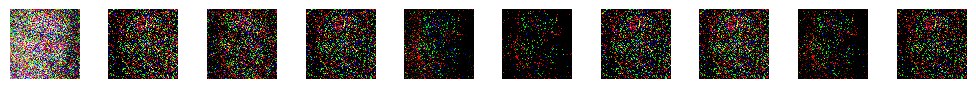

2/2 [==============================] - 0s 22ms/step
Epoch 940/1000, D Loss: 0.677983820438385, G Loss: 3.7943115234375
2/2 [==============================] - 0s 22ms/step
Epoch 941/1000, D Loss: 0.2838533744215965, G Loss: 5.495494842529297
2/2 [==============================] - 0s 22ms/step
Epoch 942/1000, D Loss: 0.238494411110878, G Loss: 6.298720836639404
2/2 [==============================] - 0s 22ms/step
Epoch 943/1000, D Loss: 1.6636709570884705, G Loss: 5.534879684448242
2/2 [==============================] - 0s 23ms/step
Epoch 944/1000, D Loss: 0.5203227559104562, G Loss: 6.522275447845459
2/2 [==============================] - 0s 22ms/step
Epoch 945/1000, D Loss: 1.2808231115341187, G Loss: 2.1536285877227783
2/2 [==============================] - 0s 23ms/step
Epoch 946/1000, D Loss: 0.1207885779440403, G Loss: 5.980949878692627
2/2 [==============================] - 0s 22ms/step
Epoch 947/1000, D Loss: 0.22698554396629333, G Loss: 4.347360134124756
2/2 [=====================

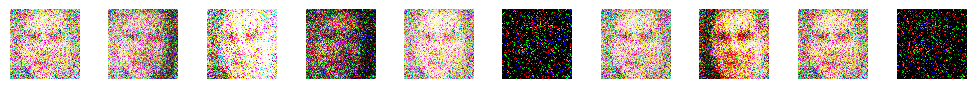

2/2 [==============================] - 0s 23ms/step
Epoch 950/1000, D Loss: 0.26695656031370163, G Loss: 4.007552623748779
2/2 [==============================] - 0s 22ms/step
Epoch 951/1000, D Loss: 0.24326040595769882, G Loss: 4.2158894538879395
2/2 [==============================] - 0s 22ms/step
Epoch 952/1000, D Loss: 0.6049296855926514, G Loss: 2.3605709075927734
2/2 [==============================] - 0s 23ms/step
Epoch 953/1000, D Loss: 0.1364581659436226, G Loss: 4.3863091468811035
2/2 [==============================] - 0s 22ms/step
Epoch 954/1000, D Loss: 0.29708581417798996, G Loss: 14.921087265014648
2/2 [==============================] - 0s 22ms/step
Epoch 955/1000, D Loss: 5.3975138664245605, G Loss: 0.8906791806221008
2/2 [==============================] - 0s 23ms/step
Epoch 956/1000, D Loss: 0.5168469175696373, G Loss: 4.473472595214844
2/2 [==============================] - 0s 22ms/step
Epoch 957/1000, D Loss: 0.7355324327945709, G Loss: 4.217581748962402
2/2 [===========

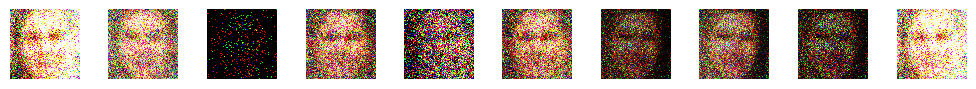

2/2 [==============================] - 0s 23ms/step
Epoch 960/1000, D Loss: 0.47269970178604126, G Loss: 2.7814910411834717
2/2 [==============================] - 0s 22ms/step
Epoch 961/1000, D Loss: 0.8444105982780457, G Loss: 2.4471123218536377
2/2 [==============================] - 0s 22ms/step
Epoch 962/1000, D Loss: 0.7545795142650604, G Loss: 3.9357590675354004
2/2 [==============================] - 0s 22ms/step
Epoch 963/1000, D Loss: 0.6168793886899948, G Loss: 3.0312325954437256
2/2 [==============================] - 0s 22ms/step
Epoch 964/1000, D Loss: 0.451275497674942, G Loss: 2.6138792037963867
2/2 [==============================] - 0s 22ms/step
Epoch 965/1000, D Loss: 0.3737719655036926, G Loss: 3.5067102909088135
2/2 [==============================] - 0s 22ms/step
Epoch 966/1000, D Loss: 1.4584306478500366, G Loss: 1.043100357055664
2/2 [==============================] - 0s 22ms/step
Epoch 967/1000, D Loss: 0.2681170105934143, G Loss: 5.002506732940674
2/2 [=============

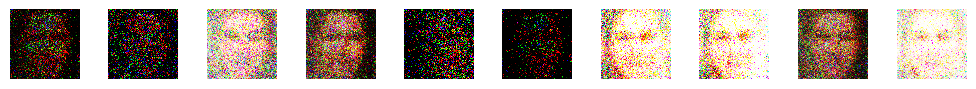

2/2 [==============================] - 0s 23ms/step
Epoch 970/1000, D Loss: 0.21791766583919525, G Loss: 5.526548862457275
2/2 [==============================] - 0s 22ms/step
Epoch 971/1000, D Loss: 0.8708859980106354, G Loss: 5.087234020233154
2/2 [==============================] - 0s 22ms/step
Epoch 972/1000, D Loss: 0.21614950895309448, G Loss: 7.986093521118164
2/2 [==============================] - 0s 22ms/step
Epoch 973/1000, D Loss: 2.8917741775512695, G Loss: 1.4424399137496948
2/2 [==============================] - 0s 22ms/step
Epoch 974/1000, D Loss: 0.8906137645244598, G Loss: 2.4982616901397705
2/2 [==============================] - 0s 22ms/step
Epoch 975/1000, D Loss: 1.1986125111579895, G Loss: 1.3399277925491333
2/2 [==============================] - 0s 22ms/step
Epoch 976/1000, D Loss: 0.6216916143894196, G Loss: 3.45589542388916
2/2 [==============================] - 0s 22ms/step
Epoch 977/1000, D Loss: 0.6047637760639191, G Loss: 2.358870029449463
2/2 [===============

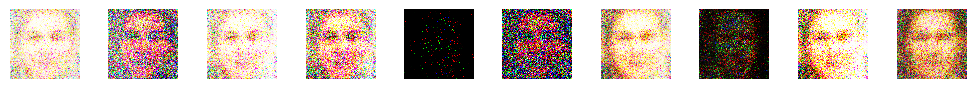

2/2 [==============================] - 0s 22ms/step
Epoch 980/1000, D Loss: 0.5505851954221725, G Loss: 2.3239879608154297
2/2 [==============================] - 0s 22ms/step
Epoch 981/1000, D Loss: 0.284976102411747, G Loss: 3.8540749549865723
2/2 [==============================] - 0s 23ms/step
Epoch 982/1000, D Loss: 0.29292023181915283, G Loss: 3.585458278656006
2/2 [==============================] - 0s 22ms/step
Epoch 983/1000, D Loss: 0.28098367154598236, G Loss: 3.908867120742798
2/2 [==============================] - 0s 22ms/step
Epoch 984/1000, D Loss: 1.6903564929962158, G Loss: 0.6985688805580139
2/2 [==============================] - 0s 23ms/step
Epoch 985/1000, D Loss: 0.7959189116954803, G Loss: 2.2923693656921387
2/2 [==============================] - 0s 23ms/step
Epoch 986/1000, D Loss: 0.46441930532455444, G Loss: 3.9728665351867676
2/2 [==============================] - 0s 23ms/step
Epoch 987/1000, D Loss: 0.9721047282218933, G Loss: 5.314479351043701
2/2 [============

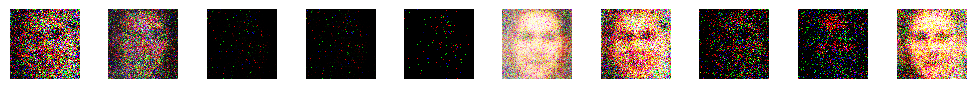

2/2 [==============================] - 0s 23ms/step
Epoch 990/1000, D Loss: 1.423048198223114, G Loss: 1.1772247552871704
2/2 [==============================] - 0s 22ms/step
Epoch 991/1000, D Loss: 0.9338293373584747, G Loss: 1.0904505252838135
2/2 [==============================] - 0s 22ms/step
Epoch 992/1000, D Loss: 0.8463054299354553, G Loss: 2.3896243572235107
2/2 [==============================] - 0s 22ms/step
Epoch 993/1000, D Loss: 0.5669074654579163, G Loss: 3.393777847290039
2/2 [==============================] - 0s 22ms/step
Epoch 994/1000, D Loss: 0.5546018779277802, G Loss: 2.3948357105255127
2/2 [==============================] - 0s 22ms/step
Epoch 995/1000, D Loss: 0.7008934915065765, G Loss: 2.7287347316741943
2/2 [==============================] - 0s 23ms/step
Epoch 996/1000, D Loss: 0.5264218002557755, G Loss: 2.8535828590393066
2/2 [==============================] - 0s 22ms/step
Epoch 997/1000, D Loss: 0.6337222456932068, G Loss: 4.663082122802734
2/2 [==============

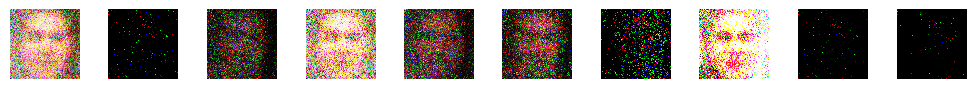

In [8]:
generator = create_generator()
discriminator = create_discriminator()
gan = create_gan(generator, discriminator)
train_gan(generator, discriminator, gan, X_train, epochs=1000, batch_size=50)

1/1 [==============================] - 0s 23ms/step
254.71431612968445


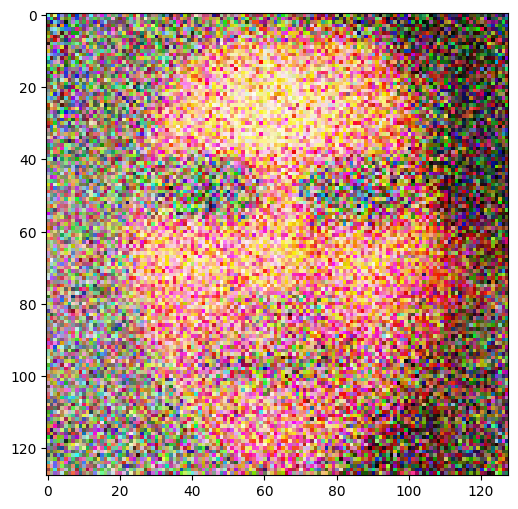

In [17]:
noise = np.random.normal(0, 1, size=[1, 100])
generated_images = generator.predict(noise)
generated_images = generated_images.reshape(1, 128, 128, 3)
plt.figure(figsize=(12,6))
for img in generated_images:
  print(np.max(img) * 255)
  img_discrete = np.clip((img + 1) * 127.5, 0, 255).astype(np.uint8)
  plt.imshow((img * 255).astype(np.uint8), cmap='viridis', interpolation="nearest")
  plt.show()

In [10]:
generator.save("generator_model.h5")
discriminator.save("discriminator_model.h5")
gan.save("gan_model.h5")

/home/renz/.local/lib/python3.10/site-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
